In [ ]:
print("Hello")

Hello


In [2]:
print("kitty")

kitty


In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import joblib
import missingno as msno
sns.set(style='darkgrid')
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import IncrementalPCA
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import (
    f1_score,
    roc_auc_score,
    precision_recall_curve,
    average_precision_score,
    classification_report
)

In [4]:
RANDOM_STATE = 42
# THRESHOLD_PERCENTILE = 85 

In [5]:
# Load the dataset
data1 = pd.read_csv('Monday-WorkingHours.pcap_ISCX.csv', encoding="utf-8", encoding_errors="replace")
data2 = pd.read_csv('Tuesday-WorkingHours.pcap_ISCX.csv', encoding="utf-8", encoding_errors="replace")
data3 = pd.read_csv('Wednesday-workingHours.pcap_ISCX.csv', encoding="utf-8", encoding_errors="replace")
data4 = pd.read_csv('Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv', encoding="utf-8", encoding_errors="replace")
data5 = pd.read_csv('Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv', encoding="utf-8", encoding_errors="replace")
data6 = pd.read_csv('Friday-WorkingHours-Morning.pcap_ISCX.csv', encoding="utf-8", encoding_errors="replace")
data7 = pd.read_csv('Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv', encoding="utf-8", encoding_errors="replace")
data8 = pd.read_csv('Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv', encoding="utf-8", encoding_errors="replace")

### **1. Exploratory Data Analysis - EDA**

In [6]:
data_list = [data1, data2, data3, data4, data5, data6, data7, data8]

print('Data dimensions: ')
for i, data in enumerate(data_list, start = 1):
  rows, cols = data.shape
  print(f'Data{i} => {rows} rows, {cols} columns')

Data dimensions: 
Data1 => 529918 rows, 79 columns
Data2 => 445909 rows, 79 columns
Data3 => 692703 rows, 79 columns
Data4 => 170366 rows, 79 columns
Data5 => 288602 rows, 79 columns
Data6 => 191033 rows, 79 columns
Data7 => 286467 rows, 79 columns
Data8 => 225745 rows, 79 columns


In [7]:
data1.sample(2)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
493913,53,131,2,2,88,120,44,44,44.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
361036,53,48332,2,2,86,210,43,43,43.0,0.0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [8]:
# Merge the datasets into one
df = pd.concat(data_list)
rows, cols = df.shape

In [9]:
# savedataset as CSV
df.to_csv("All_dataset.csv", index=False)
print("Dataset saved as All_dataset.csv")

Dataset saved as All_dataset.csv


In [10]:
dt = pd.read_csv('All_dataset.csv', encoding="utf-8", encoding_errors="replace")

In [11]:
dt.shape

(2830743, 79)

In [9]:
print('Merged DataFrame =>')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')

Merged DataFrame =>
Number of rows: 2830743
Number of columns: 79
Total cells: 223628697


In [10]:
df.sample(10)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
126542,53,50461,1,1,44,60,44,44,44.000000,0.000000,...,20,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN
69424,51776,35333,5,1,425,6,306,6,85.000000,126.281432,...,20,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN
268983,53,30929,1,1,62,78,62,62,62.000000,0.000000,...,32,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN
379328,53,40264,4,4,172,388,43,43,43.000000,0.000000,...,20,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN
657880,443,19691477,13,18,4294,18273,1985,0,330.307692,726.446876,...,20,465407.0,606486.9004,894258,36556,9380331.5,845390.7046,9978113,8782550,BENIGN
235053,443,122,2,0,12,0,6,6,6.000000,0.000000,...,20,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN
3383,443,5103560,9,7,389,5190,202,0,43.222222,71.595701,...,20,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN
187437,1041,48,2,0,4,0,2,2,2.000000,0.000000,...,24,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN
343956,443,15267,1,1,0,0,0,0,0.000000,0.000000,...,40,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN
272757,80,6248787,3,1,0,0,0,0,0.000000,0.000000,...,20,0.0,0.0000,0,0,0.0,0.0000,0,0,BENIGN


In [11]:
df.columns

Index([' Destination Port', ' Flow Duration', ' Total Fwd Packets',
       ' Total Backward Packets', 'Total Length of Fwd Packets',
       ' Total Length of Bwd Packets', ' Fwd Packet Length Max',
       ' Fwd Packet Length Min', ' Fwd Packet Length Mean',
       ' Fwd Packet Length Std', 'Bwd Packet Length Max',
       ' Bwd Packet Length Min', ' Bwd Packet Length Mean',
       ' Bwd Packet Length Std', 'Flow Bytes/s', ' Flow Packets/s',
       ' Flow IAT Mean', ' Flow IAT Std', ' Flow IAT Max', ' Flow IAT Min',
       'Fwd IAT Total', ' Fwd IAT Mean', ' Fwd IAT Std', ' Fwd IAT Max',
       ' Fwd IAT Min', 'Bwd IAT Total', ' Bwd IAT Mean', ' Bwd IAT Std',
       ' Bwd IAT Max', ' Bwd IAT Min', 'Fwd PSH Flags', ' Bwd PSH Flags',
       ' Fwd URG Flags', ' Bwd URG Flags', ' Fwd Header Length',
       ' Bwd Header Length', 'Fwd Packets/s', ' Bwd Packets/s',
       ' Min Packet Length', ' Max Packet Length', ' Packet Length Mean',
       ' Packet Length Std', ' Packet Length Variance', '

In [12]:
# removing leading/trailing whitespace in col names
col_names = {col: col.strip() for col in df.columns}
df.rename(columns = col_names, inplace = True)

In [13]:
df.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2830743 entries, 0 to 225744
Data columns (total 79 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int64  
 1   Flow Duration                int64  
 2   Total Fwd Packets            int64  
 3   Total Backward Packets       int64  
 4   Total Length of Fwd Packets  int64  
 5   Total Length of Bwd Packets  int64  
 6   Fwd Packet Length Max        int64  
 7   Fwd Packet Length Min        int64  
 8   Fwd Packet Length Mean       float64
 9   Fwd Packet Length Std        float64
 10  Bwd Packet Length Max        int64  
 11  Bwd Packet Length Min        int64  
 12  Bwd Packet Length Mean       float64
 13  Bwd Packet Length Std        float64
 14  Flow Bytes/s                 float64
 15  Flow Packets/s               float64
 16  Flow IAT Mean                float64
 17  Flow IAT Std                 float64
 18  Flow IAT Max                 int64  
 19  Flow I

In [15]:
df.describe()

e:\Projects\ProLabR\01. NADS\NADS\venv\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
e:\Projects\ProLabR\01. NADS\NADS\venv\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
count,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,...,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06,2.830743e+06
mean,8.071483e+03,1.478566e+07,9.361160e+00,1.039377e+01,5.493024e+02,1.616264e+04,2.075999e+02,1.871366e+01,5.820194e+01,6.891013e+01,...,5.418218e+00,-2.741688e+03,8.155132e+04,4.113412e+04,1.531825e+05,5.829582e+04,8.316037e+06,5.038439e+05,8.695752e+06,7.920031e+06
std,1.828363e+04,3.365374e+07,7.496728e+02,9.973883e+02,9.993589e+03,2.263088e+06,7.171848e+02,6.033935e+01,1.860912e+02,2.811871e+02,...,6.364257e+02,1.084989e+06,6.485999e+05,3.933815e+05,1.025825e+06,5.770923e+05,2.363008e+07,4.602984e+06,2.436689e+07,2.336342e+07
min,0.000000e+00,-1.300000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,-5.368707e+08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,5.300000e+01,1.550000e+02,2.000000e+00,1.000000e+00,1.200000e+01,0.000000e+00,6.000000e+00,0.000000e+00,6.000000e+00,0.000000e+00,...,0.000000e+00,2.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,8.000000e+01,3.131600e+04,2.000000e+00,2.000000e+00,6.200000e+01,1.230000e+02,3.700000e+01,2.000000e+00,3.400000e+01,0.000000e+00,...,1.000000e+00,2.400000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,4.430000e+02,3.204828e+06,5.000000e+00,4.000000e+00,1.870000e+02,4.820000e+02,8.100000e+01,3.600000e+01,5.000000e+01,2.616295e+01,...,2.000000e+00,3.200000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,6.553500e+04,1.200000e+08,2.197590e+05,2.919220e+05,1.290000e+07,6.554530e+08,2.482000e+04,2.325000e+03,5.940857e+03,7.125597e+03,...,2.135570e+05,1.380000e+02,1.100000e+08,7.420000e+07,1.100000e+08,1.100000e+08,1.200000e+08,7.690000e+07,1.200000e+08,1.200000e+08


In [16]:
pd.options.display.max_rows = 80

print('Overview of Columns:')
df.describe().transpose()

Overview of Columns:


e:\Projects\ProLabR\01. NADS\NADS\venv\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
e:\Projects\ProLabR\01. NADS\NADS\venv\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


,count,mean,std,min,25%,50%,75%,max
Destination Port,2830743.0,8.071483e+03,1.828363e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2830743.0,1.478566e+07,3.365374e+07,-1.300000e+01,155.000000,31316.000000,3.204828e+06,1.200000e+08
Total Fwd Packets,2830743.0,9.361160e+00,7.496728e+02,1.000000e+00,2.000000,2.000000,5.000000e+00,2.197590e+05
Total Backward Packets,2830743.0,1.039377e+01,9.973883e+02,0.000000e+00,1.000000,2.000000,4.000000e+00,2.919220e+05
Total Length of Fwd Packets,2830743.0,5.493024e+02,9.993589e+03,0.000000e+00,12.000000,62.000000,1.870000e+02,1.290000e+07
Total Length of Bwd Packets,2830743.0,1.616264e+04,2.263088e+06,0.000000e+00,0.000000,123.000000,4.820000e+02,6.554530e+08
Fwd Packet Length Max,2830743.0,2.075999e+02,7.171848e+02,0.000000e+00,6.000000,37.000000,8.100000e+01,2.482000e+04
Fwd Packet Length Min,2830743.0,1.871366e+01,6.033935e+01,0.000000e+00,0.000000,2.000000,3.600000e+01,2.325000e+03
Fwd Packet Length Mean,2830743.0,5.820194e+01,1.860912e+02,0.000000e+00,6.000000,34.000000,5.000000e+01,5.940857e+03
Fwd Packet Length Std,2830743.0,6.891013e+01,2.811871e+02,0.000000e+00,0.000000,0.000000,2.616295e+01,7.125597e+03


In [17]:
pd.options.display.max_columns = 80
df

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,3.000000e+06,5.000000e+05,4.0,0.0,4,4,4,4.0,0.0,4,4,0,0.0,0.0,0,0,0,0,0,0,40,0,5.000000e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,4.000000e+06,6.666667e+05,3.0,0.0,3,3,3,3.0,0.0,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,6.666667e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,245,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61374,61,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.967213e+05,3.278689e+04,61.0,0.0,61,61,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.639344e+04,16393.44262,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225741,61378,72,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.666667e+05,2.777778e+04,72.0,0.0,72,72,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.388889e+04,13888.88889,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225742,61375,75,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.600000e+05,2.666667e+04,75.0,0.0,75,75,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.333333e+04,13333.33333,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225743,61323,48,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,2.500000e+05,4.166667e+04,48.0,0.0,48,48,48,48.0,0.0,48,48,0,0.0,0.0,0,0,0,0,0,0,40,0,4.166667e+04,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,0,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,4719,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [18]:
df['Label'].value_counts()

Label
BENIGN                        2273097
DoS Hulk                       231073
PortScan                       158930
DDoS                           128027
DoS GoldenEye                   10293
FTP-Patator                      7938
SSH-Patator                      5897
DoS slowloris                    5796
DoS Slowhttptest                 5499
Bot                              1966
Web Attack � Brute Force         1507
Web Attack � XSS                  652
Infiltration                       36
Web Attack � Sql Injection         21
Heartbleed                         11
Name: count, dtype: int64

In [19]:
# fix the encoding issues in the label
df['Label'] = df['Label'] \
    .str.replace('ï¿½', '-', regex=False) \
    .str.replace('�', '-', regex=False) \
    .str.strip()

In [20]:
sorted(df['Label'].unique())

['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS']

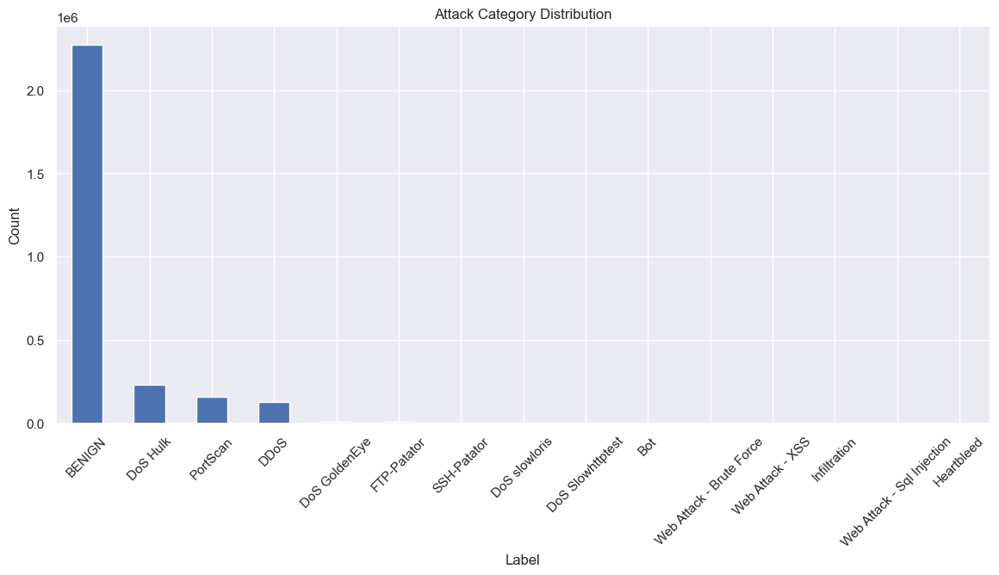

In [21]:
df['Label'].value_counts().plot(kind='bar', figsize=(14,6))
plt.title("Attack Category Distribution")
plt.xlabel("Label")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

In [22]:
df['Label'].value_counts(normalize=True) * 100

Label
BENIGN                        80.300366
DoS Hulk                       8.162981
PortScan                       5.614427
DDoS                           4.522735
DoS GoldenEye                  0.363615
FTP-Patator                    0.280421
SSH-Patator                    0.208320
DoS slowloris                  0.204752
DoS Slowhttptest               0.194260
Bot                            0.069452
Web Attack - Brute Force       0.053237
Web Attack - XSS               0.023033
Infiltration                   0.001272
Web Attack - Sql Injection     0.000742
Heartbleed                     0.000389
Name: proportion, dtype: float64

The distribution of the **Label** column shows that a large majority of the traffic is benign (over 80%).
Among the attack categories, 'DoS Hulk' is the most frequent, followed by 'PortScan' and 'DDoS'. Other attack types like 'Web Attack - Sql Injection', 'Infiltration', and 'Heartbleed' are present in very small percentages. ---> ***highly imbalanced dataset with a majority of records labeled as 'Benign***

In [23]:
df['AttackBinary'] = df['Label'].apply(lambda x: 'Normal' if x == 'BENIGN' else 'Attack')

In [24]:
df['AttackBinary'].value_counts()
df['AttackBinary'].value_counts(normalize=True) * 100

AttackBinary
Normal    80.300366
Attack    19.699634
Name: proportion, dtype: float64

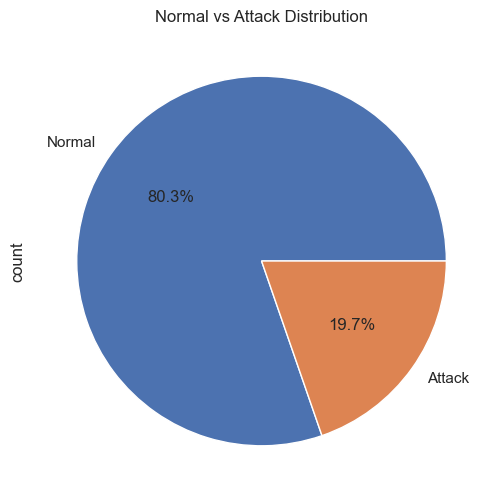

In [25]:
df['AttackBinary'].value_counts().plot(kind='pie', autopct='%1.1f%%', figsize=(6,6))
plt.title("Normal vs Attack Distribution")
plt.show()

### **2. Data Cleaning**

In [26]:
# handle duplicates
duplicates = df.duplicated().sum()
print("Duplicates => ", duplicates)

Duplicates =>  308381


In [27]:
df.drop_duplicates(inplace = True)

In [28]:
duplicates = df.duplicated().sum()
df.shape

(2522362, 80)

In [29]:
# copy of the dataset
df_before = df.copy()

label_dist_before = df_before['Label'].value_counts()

In [30]:
# handle missing values
missing_values = df.isnull().sum()
missing_values

print(missing_values.loc[missing_values > 0])

Flow Bytes/s    353
dtype: int64


In [31]:
# check infinity values
numeric_cols = df.select_dtypes(include = np.number).columns
inf_count = np.isinf(df[numeric_cols]).sum()
print(inf_count[inf_count > 0])

Flow Bytes/s      1211
Flow Packets/s    1564
dtype: int64


In [32]:
inf_rows = df[np.isinf(df['Flow Bytes/s']) | np.isinf(df['Flow Packets/s'])]
print('Rows with infinity values in \'Flow Bytes/s\' or \'Flow Packets/s\':')
display(inf_rows[['Flow Bytes/s', 'Flow Packets/s', 'Label']].sample(5))

Rows with infinity values in 'Flow Bytes/s' or 'Flow Packets/s':


,Flow Bytes/s,Flow Packets/s,Label
350748,inf,inf,BENIGN
157267,inf,inf,BENIGN
66806,NaN,inf,BENIGN
31119,inf,inf,BENIGN
23828,inf,inf,BENIGN


In [33]:
# replace infinite values with NaN
print(f'Initial missing values: {df.isna().sum().sum()}')

df.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {df.isna().sum().sum()}')

Initial missing values: 353
Missing values after processing infinite values: 3128


In [34]:
missing = df.isna().sum()
print(missing.loc[missing > 0])

Flow Bytes/s      1564
Flow Packets/s    1564
dtype: int64


In [35]:
# missing value percentage in the dataset
mis_per = (missing / len(df)) * 100

In [36]:
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

In [37]:
print(mis_table.loc[mis_per > 0])

                Missing Values  Percentage of Total Values
Flow Bytes/s              1564                        0.06
Flow Packets/s            1564                        0.06


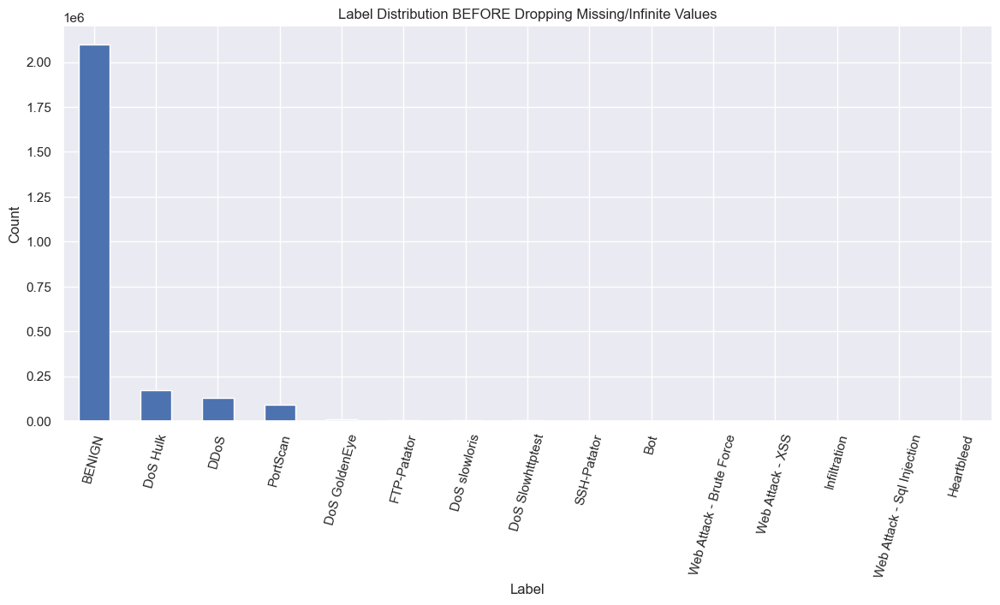

In [38]:
plt.figure(figsize=(14,6))
label_dist_before.plot(kind='bar')
plt.title("Label Distribution BEFORE Dropping Missing/Infinite Values")
plt.xlabel("Label")
plt.ylabel("Count")
plt.xticks(rotation=75)
plt.show()

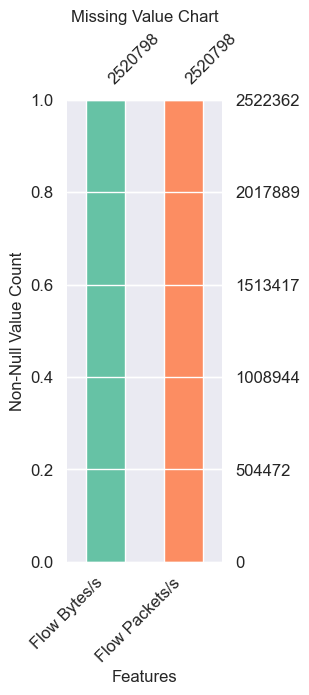

In [39]:
sns.set_palette('Set2')
colors = sns.color_palette()

missing_vals = [col for col in df.columns if df[col].isna().any()]

fig, ax = plt.subplots(figsize = (2, 6))
msno.bar(df[missing_vals], ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
plt.show()

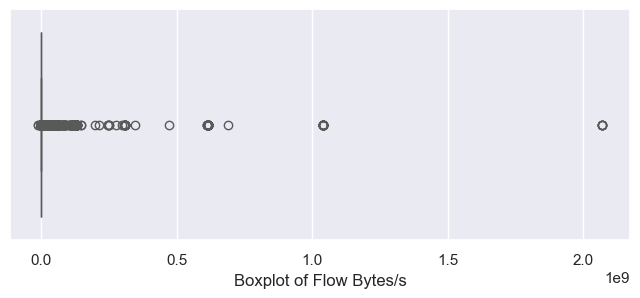

In [40]:
plt.figure(figsize = (8, 3))
sns.boxplot(x = data['Flow Bytes/s'])
plt.xlabel('Boxplot of Flow Bytes/s')
plt.show()

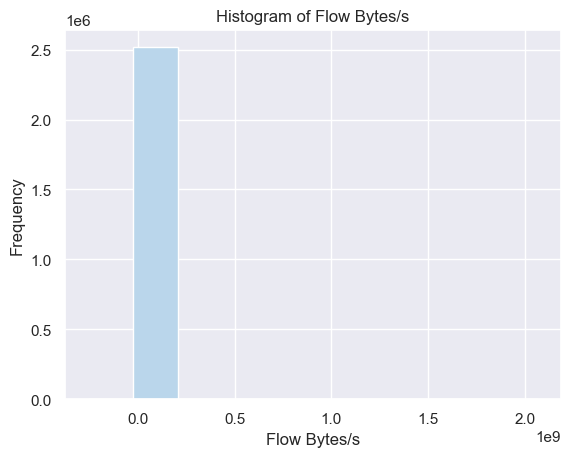

In [41]:
colors = sns.color_palette('Blues')
plt.hist(df['Flow Bytes/s'], color = colors[1])
plt.title('Histogram of Flow Bytes/s')
plt.xlabel('Flow Bytes/s')
plt.ylabel('Frequency')
plt.show()

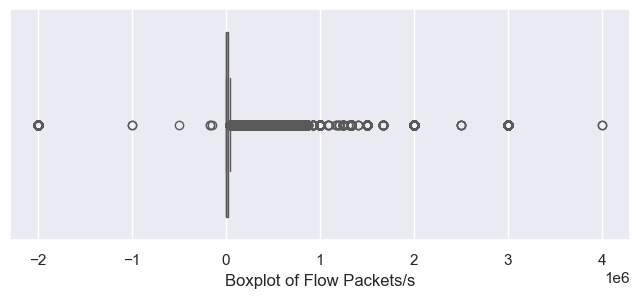

In [42]:
df.reset_index(drop=True, inplace=True)
plt.figure(figsize = (8, 3))
sns.boxplot(x = df['Flow Packets/s'])
plt.xlabel('Boxplot of Flow Packets/s')
plt.show()

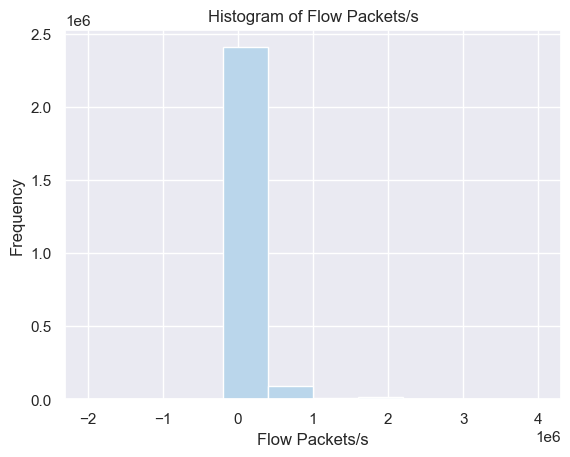

In [43]:
plt.hist(df['Flow Packets/s'], color = colors[1])
plt.title('Histogram of Flow Packets/s')
plt.xlabel('Flow Packets/s')
plt.ylabel('Frequency')
plt.show()

In [44]:
fb_median = df['Flow Bytes/s'].median()
fp_median = df['Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', fb_median)
print('Median of Flow Packets/s: ', fp_median)

Median of Flow Bytes/s:  3715.0378579999997
Median of Flow Packets/s:  69.742244285


In [45]:
# Fill missing values with median
df['Flow Bytes/s'].fillna(fb_median, inplace = True)
df['Flow Packets/s'].fillna(fp_median, inplace = True)

C:\Users\USER\AppData\Local\Temp\ipykernel_11640\3966089183.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Flow Bytes/s'].fillna(fb_median, inplace = True)
C:\Users\USER\AppData\Local\Temp\ipykernel_11640\3966089183.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For e

In [46]:
print('Number of \'Flow Bytes/s\' missing values:', df['Flow Bytes/s'].isna().sum())
print('Number of \'Flow Packets/s\' missing values:', df['Flow Packets/s'].isna().sum())

Number of 'Flow Bytes/s' missing values: 0
Number of 'Flow Packets/s' missing values: 0


In [47]:
label_dist_after = df['Label'].value_counts()

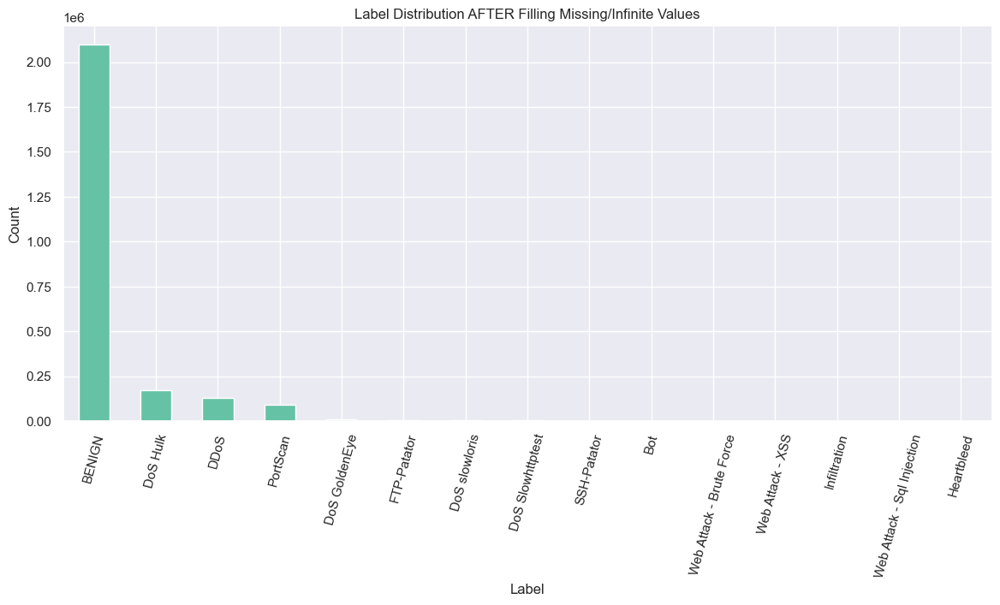

In [48]:
plt.figure(figsize=(14,6))
label_dist_after.plot(kind='bar')
plt.title("Label Distribution AFTER Filling Missing/Infinite Values")
plt.xlabel("Label")
plt.ylabel("Count")
plt.xticks(rotation=75)
plt.show()

<Figure size 1400x1000 with 0 Axes>

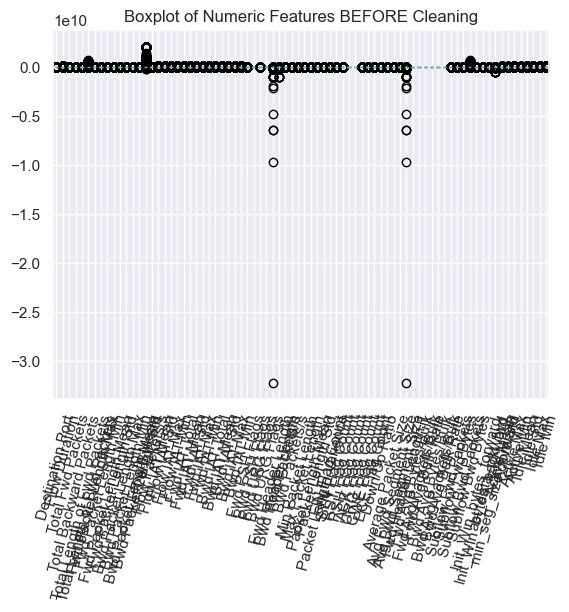

In [49]:
plt.figure(figsize=(14,10))
df_before[numeric_cols].plot(kind='box')
plt.title("Boxplot of Numeric Features BEFORE Cleaning")
plt.xticks(rotation=75)
plt.show()

<Figure size 1400x1000 with 0 Axes>

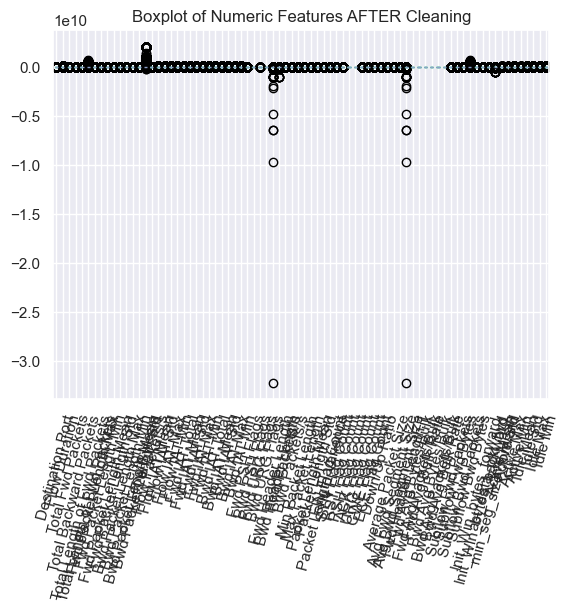

In [50]:
plt.figure(figsize=(14,10))
df[numeric_cols].plot(kind='box')
plt.title("Boxplot of Numeric Features AFTER Cleaning")
plt.xticks(rotation=75)
plt.show()

In [51]:
df.sample(10)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,AttackBinary
946322,443,5457837,6,7,998,394,517,0,166.333333,236.086990,206,2,56.285714,81.753113,2.550461e+02,2.381896e+00,4.548198e+05,1.406863e+06,4917022,3,540812,1.081624e+05,1.258162e+05,307745,63,5341733,8.902888e+05,2.067374e+06,5108697,3,0,0,0,0,132,144,1.099337,1.282559,0,517,99.428571,168.376736,2.835073e+04,0,0,0,1,0,0,0,0,1,107.076923,166.333333,56.285714,132,0,0,0,0,0,0,6,998,7,394,8192,31088,5,20,0.00000,0.0000,0,0,0.0,0.0000,0,0,BENIGN,Normal
1105989,80,85665075,7,6,324,11595,324,0,46.285714,122.460489,4344,0,1932.500000,1754.831473,1.391349e+02,1.517538e-01,7.138756e+06,2.470000e+07,85400000,0,85400000,1.420000e+07,3.490000e+07,85400000,0,244395,4.887900e+04,9.629001e+04,220132,48,0,0,0,0,232,200,0.081714,0.070040,0,4344,851.357143,1461.352251,2.135550e+06,0,0,0,0,1,0,0,0,0,916.846154,46.285714,1932.500000,232,0,0,0,0,0,0,7,324,6,11595,251,235,1,32,4.00000,0.0000,4,4,85400000.0,0.0000,85400000,85400000,DoS Hulk,Attack
1710277,53,3,2,2,74,106,37,37,37.000000,0.000000,53,53,53.000000,0.000000,6.000000e+07,1.333333e+06,1.000000e+00,0.000000e+00,1,1,1,1.000000e+00,0.000000e+00,1,1,1,1.000000e+00,0.000000e+00,1,1,0,0,0,0,40,40,666666.666700,666666.666700,37,53,43.400000,8.763561,7.680000e+01,0,0,0,0,0,0,0,0,1,54.250000,37.000000,53.000000,40,0,0,0,0,0,0,2,74,2,106,-1,-1,1,20,0.00000,0.0000,0,0,0.0,0.0000,0,0,BENIGN,Normal
827877,53,167,2,2,46,46,23,23,23.000000,0.000000,23,23,23.000000,0.000000,5.508982e+05,2.395210e+04,5.566667e+01,5.589574e+01,115,4,4,4.000000e+00,0.000000e+00,4,4,48,4.800000e+01,0.000000e+00,48,48,0,0,0,0,64,64,11976.047900,11976.047900,23,23,23.000000,0.000000,0.000000e+00,0,0,0,0,0,0,0,0,1,28.750000,23.000000,23.000000,64,0,0,0,0,0,0,2,46,2,46,-1,-1,1,32,0.00000,0.0000,0,0,0.0,0.0000,0,0,BENIGN,Normal
1217486,80,115606629,22,16,2935,758,905,0,133.409091,282.024764,200,0,47.375000,76.209251,3.194453e+01,3.287009e-01,3.124503e+06,4.666040e+06,10200000,15,116000000,5.505078e+06,5.094305e+06,10200000,508,113000000,7.529440e+06,4.621487e+06,10200000,51605,0,0,0,0,460,328,0.190301,0.138400,0,905,94.692308,219.759576,4.829427e+04,0,0,0,1,0,0,0,0,0,97.184211,133.409091,47.375000,460,0,0,0,0,0,0,22,2935,16,758,29200,127,21,20,95773.45455,151768.2764,553357,47967,10200000.0,51498.7788,10200000,10000000,BENIGN,Normal
1225619,22,132,1,1,6,6,6,6,6.000000,0.000000,6,6,6.000000,0.000000,9.090909e+04,1.515152e+04,1.320000e+02,0.000000e+00,132,132,0,0.000000e+00,0.000000e+00,0,0,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,20,20,7575.757576,7575.757576,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,1,9.000000,6.000000,6.000000,20,0,0,0,0,0,0,1,6,1,6,16062,245,0,20,0.00000,0.0000,0,0,0.0,0.0000,0,0,BENIGN,Normal
2312928,443,43

### **3. Patterns & Visusalization**

In [52]:
data = df.copy()

In [53]:
data['Label'].unique()

array(['BENIGN', 'FTP-Patator', 'SSH-Patator', 'DoS slowloris',
       'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye', 'Heartbleed',
       'Web Attack - Brute Force', 'Web Attack - XSS',
       'Web Attack - Sql Injection', 'Infiltration', 'Bot', 'PortScan',
       'DDoS'], dtype=object)

In [54]:
# attacks & BENIGN
data['Label'].value_counts()

Label
BENIGN                        2096484
DoS Hulk                       172849
DDoS                           128016
PortScan                        90819
DoS GoldenEye                   10286
FTP-Patator                      5933
DoS slowloris                    5385
DoS Slowhttptest                 5228
SSH-Patator                      3219
Bot                              1953
Web Attack - Brute Force         1470
Web Attack - XSS                  652
Infiltration                       36
Web Attack - Sql Injection         21
Heartbleed                         11
Name: count, dtype: int64

In [55]:
# Creating a dictionary that maps each label to its attack type
attack_map = {
    'BENIGN': 'BENIGN',
    'DDoS': 'DDoS',
    'DoS Hulk': 'DoS',
    'DoS GoldenEye': 'DoS',
    'DoS slowloris': 'DoS',
    'DoS Slowhttptest': 'DoS',
    'PortScan': 'Port Scan',
    'FTP-Patator': 'Brute Force',
    'SSH-Patator': 'Brute Force',
    'Bot': 'Bot',
    'Web Attack - Brute Force': 'Web Attack',
    'Web Attack - XSS': 'Web Attack',
    'Web Attack - Sql Injection': 'Web Attack',
    'Infiltration': 'Infiltration',
    'Heartbleed': 'Heartbleed'
}

In [56]:
print(data.columns.tolist())

['Destination Port', 'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets', 'Total Length of Fwd Packets', 'Total Length of Bwd Packets', 'Fwd Packet Length Max', 'Fwd Packet Length Min', 'Fwd Packet Length Mean', 'Fwd Packet Length Std', 'Bwd Packet Length Max', 'Bwd Packet Length Min', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s', 'Min Packet Length', 'Max Packet Length', 'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count', 'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count', 'ECE Flag Count

In [57]:
# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
data['Attack Type'] = data['Label'].map(attack_map)

In [58]:
data['Attack Type'].value_counts()

Attack Type
BENIGN          2096484
DoS              193748
DDoS             128016
Port Scan         90819
Brute Force        9152
Web Attack         2143
Bot                1953
Infiltration         36
Heartbleed           11
Name: count, dtype: int64

In [59]:
data.drop('Label', axis = 1, inplace = True)

In [60]:
le = LabelEncoder()
data['Attack Number'] = le.fit_transform(data['Attack Type'])

In [61]:
print(data['Attack Number'].unique())

[0 2 4 5 8 6 1 7 3]


In [62]:
# attack type dictionary
encoded_values = data['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")

0: BENIGN
1: Bot
2: Brute Force
3: DDoS
4: DoS
5: Heartbleed
6: Infiltration
7: Port Scan
8: Web Attack


In [63]:
corr = data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)

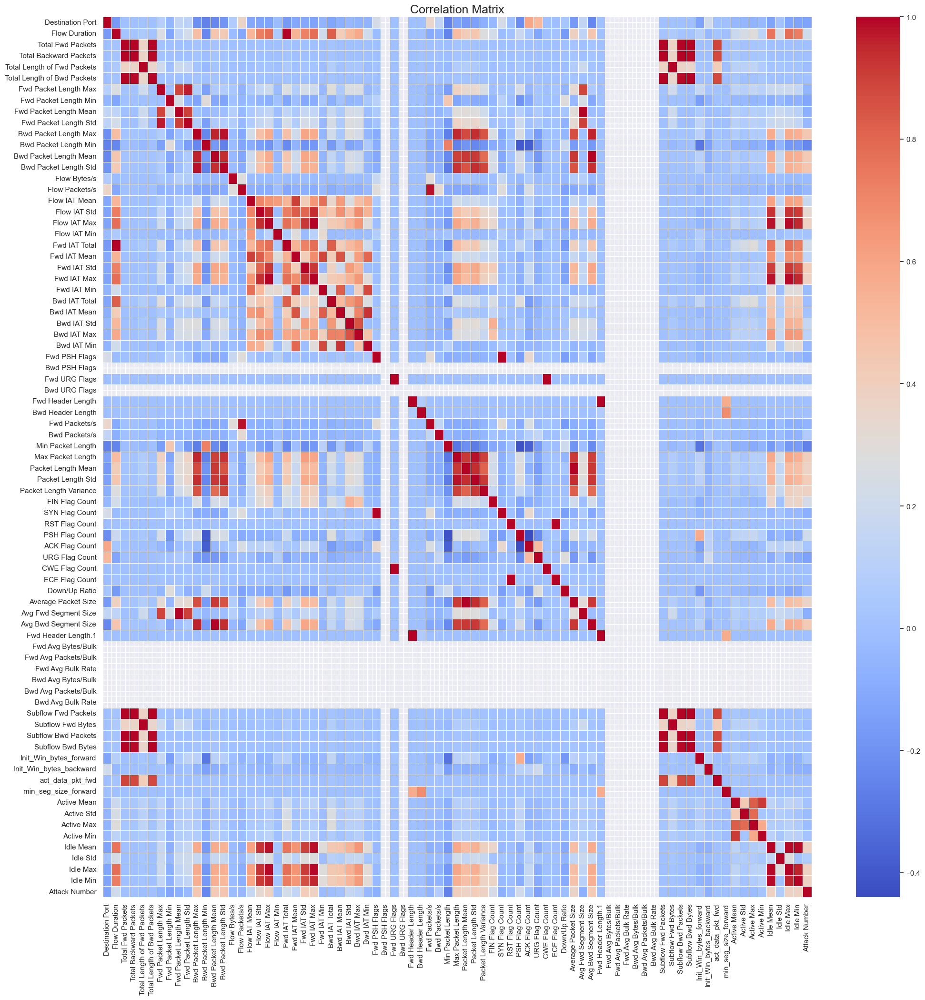

In [64]:
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()

In [65]:
# Positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))

Features with positive correlation with 'Attack Number':

1.  Flow Duration            :0.21
2.  Bwd Packet Length Max    :0.44
3.  Bwd Packet Length Mean   :0.43
4.  Bwd Packet Length Std    :0.45
5.  Flow IAT Mean            :0.17
6.  Flow IAT Std             :0.33
7.  Flow IAT Max             :0.38
8.  Flow IAT Min             :0.01
9.  Fwd IAT Total            :0.22
10. Fwd IAT Mean             :0.15
11. Fwd IAT Std              :0.41
12. Fwd IAT Max              :0.38
13. Bwd IAT Mean             :0.01
14. Bwd IAT Std              :0.16
15. Bwd IAT Max              :0.12
16. Bwd Packets/s            :0.07
17. Max Packet Length        :0.4
18. Packet Length Mean       :0.37
19. Packet Length Std        :0.41
20. Packet Length Variance   :0.38
21. FIN Flag Count           :0.23
22. PSH Flag Count           :0.21
23. ACK Flag Count           :0.03
24. Average Packet Size      :0.36
25. Avg Bwd Segment Size     :0.43
26. Init_Win_bytes_forward   :0.04
27. Active Mean              :0.0

In [66]:
print(f'Number of considerable important features: {len(pos_corr_features)}')

Number of considerable important features: 32


In [67]:
# columns with zero standard deviation - blank squares in the heatmap
std = data.std(numeric_only = True)
zero_std_cols = std[std == 0].index.tolist()
zero_std_cols

['Bwd PSH Flags',
 'Bwd URG Flags',
 'Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

Linear Relationship between data

In [68]:
# Data sampling for data analysis
sample_size = int(0.2 * len(data))
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape

(504472, 81)

In [69]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = data.select_dtypes(include=[np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []

for col in numeric_cols:
    old = data[col].mean()
    new = sampled_data[col].mean()
    
    # Check for division by zero
    if old != 0:
        variation = abs(old - new) / old * 100
    else:
        variation = 0  # or np.nan if you prefer
    
    # Filter features with variation > 5% and not nan
    if variation > 5 and not np.isnan(variation):
        high_variations.append((col, variation))
    
    print(f"{col:30} {old:<20} {new:<20} {variation:.2f}%")


Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
Destination Port               8704.762164590175    8686.623973183843    0.21%
Flow Duration                  16581323.773163011   16502842.174092913   0.47%
Total Fwd Packets              10.276271209287168   12.078061815125517   17.53%
Total Backward Packets         11.565964361975006   13.914411503512584   20.30%
Total Length of Fwd Packets    611.5751081724194    601.8445860226137    1.59%
Total Length of Bwd Packets    18133.153929927583   24424.988088536134   34.70%
Fwd Packet Length Max          231.0917683504588    230.00920169999523   0.47%
Fwd Packet Length Min          19.194640975403214   19.036483689877734   0.82%
Fwd Packet Length Mean         63.47010430762262    63.15140281141717    0.50%
Fwd Packet Length Std          77.2775869199948  

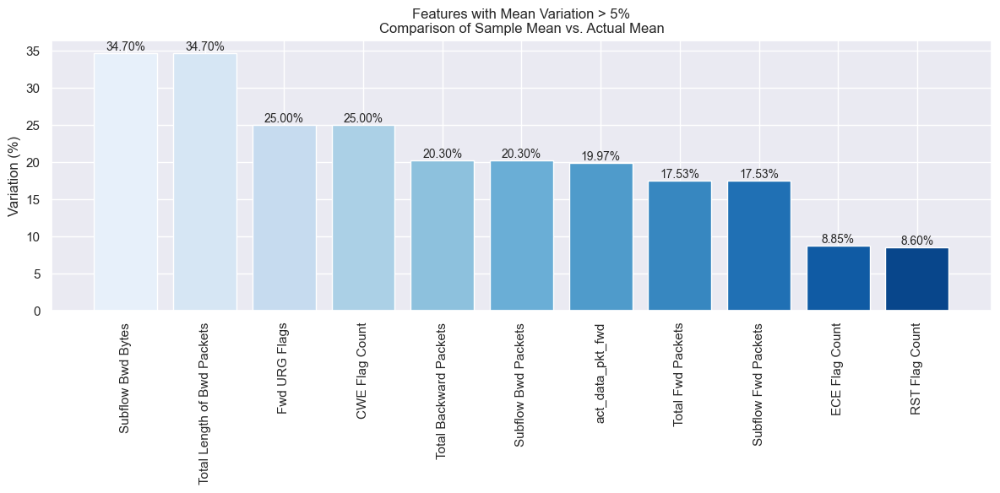

In [70]:
# Check if there are any high variations before plotting
if len(high_variations) > 0:
    # Sort variations (optional but cleaner for visuals)
    high_variations = sorted(high_variations, key=lambda x: x[1], reverse=True)
    
    # Extract labels & values
    labels = [t[0] for t in high_variations]
    values = [t[1] for t in high_variations]   # Already in percentage form
    
    # Plot
    colors = sns.color_palette('Blues', n_colors=len(labels))
    fig, ax = plt.subplots(figsize=(12, 6))
    
    ax.bar(labels, values, color=colors)
    
    # Add value labels on top of bars
    for i, v in enumerate(values):
        ax.text(i, v, f"{v:.2f}%", ha='center', va='bottom', fontsize=10)
    
    plt.xticks(rotation=90)
    ax.set_title(
        'Features with Mean Variation > 5%\n'
        'Comparison of Sample Mean vs. Actual Mean'
    )
    ax.set_ylabel('Variation (%)')
    ax.set_yticks(np.arange(0, max(values) + 5, 5))
    
    plt.tight_layout()
    plt.show()
else:
    print("\nNo features found with variation > 5%")

In [71]:
# unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(sampled_data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, sampled_data[feature].nunique()))

Unique value count for: 
1.  Destination Port              : 33346
2.  Flow Duration                 : 256627
3.  Total Fwd Packets             : 659
4.  Total Backward Packets        : 820
5.  Total Length of Fwd Packets   : 9070
6.  Total Length of Bwd Packets   : 23963
7.  Fwd Packet Length Max         : 3701
8.  Fwd Packet Length Min         : 236
9.  Fwd Packet Length Mean        : 34946
10. Fwd Packet Length Std         : 66038
11. Bwd Packet Length Max         : 3936
12. Bwd Packet Length Min         : 449
13. Bwd Packet Length Mean        : 45585
14. Bwd Packet Length Std         : 62492
15. Flow Bytes/s                  : 346856
16. Flow Packets/s                : 288294
17. Flow IAT Mean                 : 274182
18. Flow IAT Std                  : 229680
19. Flow IAT Max                  : 167860
20. Flow IAT Min                  : 45941
21. Fwd IAT Total                 : 119784
22. Fwd IAT Mean                  : 164556
23. Fwd IAT Std                   : 148638
24. Fwd IAT

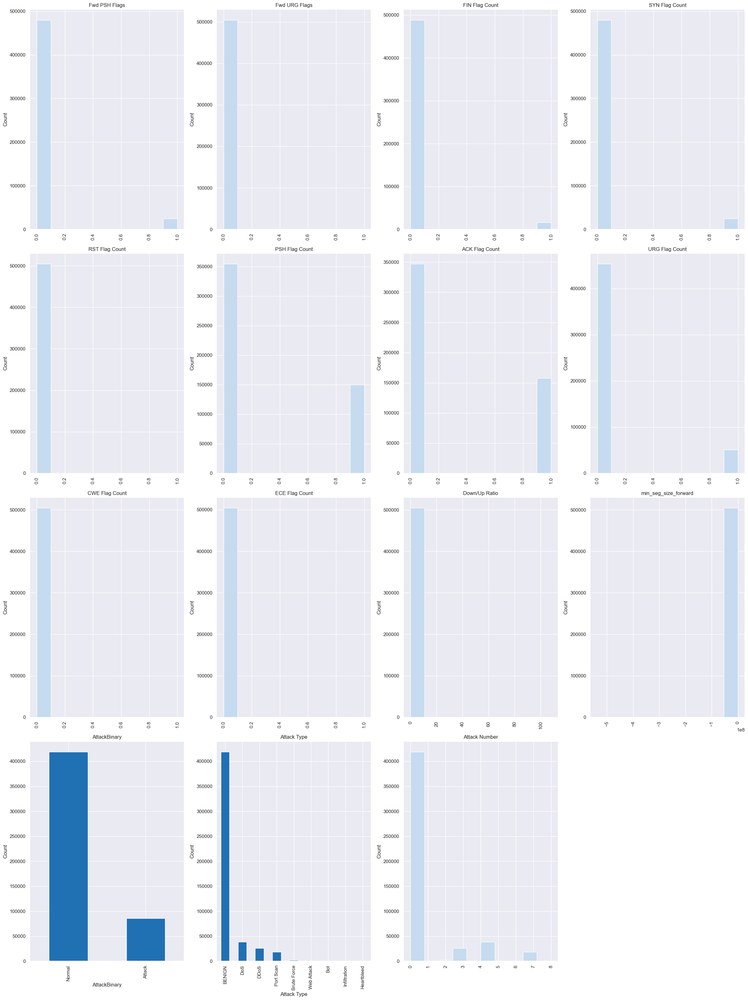

In [72]:
# Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values.
# For categorical columns, a bar plot is generated showing the count of each unique value.
# For numerical columns, a histogram is generated
unique_values = sampled_data.nunique()
selected_cols = sampled_data[[col for col in sampled_data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind = 'bar', color = color_palette[2])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()

In [73]:
# 1. Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)


,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Attack Number
Destination Port,1.00,-0.17,-0.00,-0.00,0.02,-0.00,0.09,-0.05,0.14,0.12,-0.21,-0.26,-0.24,-0.19,0.07,0.36,-0.11,-0.13,-0.13,-0.02,-0.17,-0.11,-0.11,-0.13,-0.05,-0.12,-0.07,-0.04,-0.06,-0.05,0.23,nan,0.01,nan,0.00,0.00,0.35,0.15,-0.26,-0.14,-0.17,-0.14,-0.08,-0.04,0.23,-0.01,-0.22,0.58,0.52,0.01,-0.01,0.03,-0.17,0.14,-0.24,0.00,nan,nan,nan,nan,nan,nan,-0.00,0.02,-0.00,-0.00,-0.13,0.21,-0.00,0.00,-0.04,-0.05,-0.06,-0.03,-0.13,0.01,-0.12,-0.13,-0.12
Flow Duration,-0.17,1.00,0.02,0.02,0.10,0.02,0.27,-0.12,0.14,0.23,0.49,-0.24,0.45,0.43,-0.02,-0.11,0.54,0.74,0.78,0.06,1.00,0.54,0.72,0.78,0.21,0.82,0.41,0.52,0.58,0.21,-0.02,nan,-0.00,nan,-0.00,0.00,-0.10,-0.08,-0.25,0.50,0.42,0.45,0.27,0.22,-0.02,0.01,0.18,0.04,-0.12,-0.00,0.01,-0.17,0.40,0.14,0.45,-0.00,nan,nan,nan,nan,nan,nan,0.02,0.10,0.02,0.02,0.09,-0.03,0.02,-0.00,0.19,0.25,0.29,0.12,0.76,0.24,0.78,0.73,0.21
Total Fwd Packets,-0.00,0.02,1.00,1.00,0.69,0.99,0.01,-0.00,-0.00,0.00,0.03,-0.01,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.01,0.00,-0.00,-0.00,-0.00,0.00,0.02,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,1.00,0.69,1.00,0.99,0.00,-0.00,0.87,-0.00,0.12,0.01,0.08,0.13,0.00,0.00,0.00,0.00,-0.00
Total Backward Packets,-0.00,0.02,1.00,1.00,0.68,0.99,0.01,-0.00,-0.00,0.00,0.03,-0.01,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.01,0.00,-0.00,-0.00,-0.00,0.00,0.03,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,1.00,0.68,1.00,0.99,0.00,-0.00,0.86,0.00,0.12,0.01,0.08,0.13,0.00,0.00,0.00,0.00,-0.00
Total Length of Fwd Packets,0.02,0.10,0.69,0.68,1.00,0.69,0.31,-0.00,0.29,0.25,0.04,-0.05,0.03,0.01,0.00,-0.02,0.01,0.02,0.04,-0.00,0.10,0.01,0.04,0.04,-0.01,0.12,0.01,0.06,0.07,-0.01,0.01,nan,-0.00,nan,-0.00,0.01,-0.02,-0.02,-0.05,0.12,0.13,0.09,0.06,-0.01,0.01,0.01,0.07,-0.01,-0.01,-0.00,0.01,-0.02,0.12,0.29,0.03,-0.00,nan,nan,nan,nan,nan,nan,0.69,1.00,0.68,0.69,0.05,0.01,0.78,-0.00,0.19,0.12,0.19,0.16,0.03,0.04,0.04,0.03,-0.03
Total Length of Bwd Packets,-0.00,0.02,0.99,0.99,0.69,1.00,0.01,-0.00,-0.00,-0.00,0.03,-0.00,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,-0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.02,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,0.99,0.69,0.99,1.00,0.00,-0.00,0.88,0.00,0.11,0.00,0.07,0.13,0.00,-0.00,0.00,0.00,-0.00
Fwd Packet Length Max,0.09,0.27,0.01,0.01,0.31,0.01,1.00,-0.01,0.

e:\Projects\ProLabR\01. NADS\NADS\venv\Lib\site-packages\numpy\lib\_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
e:\Projects\ProLabR\01. NADS\NADS\venv\Lib\site-packages\numpy\lib\_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


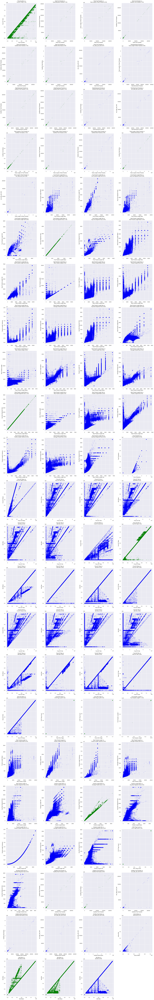

In [74]:
# 2. Strongly positive correlated feature pairs (>= 0.85)

# Only numeric columns
cols = sampled_data.select_dtypes(include=[np.number]).columns.tolist()

high_corr_pairs = []
corr_th = 0.85

for i in range(len(cols)):
    for j in range(i + 1, len(cols)):
        val = sampled_data[cols[i]].corr(sampled_data[cols[j]])

        if np.isnan(val) or val < corr_th:
            continue
        
        high_corr_pairs.append((val, cols[i], cols[j]))

# ---- Plot -----
size = len(high_corr_pairs)
cols_per_row = 4
rows = (size + cols_per_row - 1) // cols_per_row

fig, axs = plt.subplots(rows, cols_per_row, figsize=(24, int(size * 1.7)))

axs = axs.flatten()

for idx, (val, x, y) in enumerate(high_corr_pairs):
    color = 'green' if val > 0.99 else 'blue'
    axs[idx].scatter(sampled_data[x], sampled_data[y], color=color, alpha=0.1)
    axs[idx].set_xlabel(x)
    axs[idx].set_ylabel(y)
    axs[idx].set_title(f'{x} vs\n{y} ({val:.2f})')

# Remove unused axes
for i in range(idx + 1, len(axs)):
    fig.delaxes(axs[i])

fig.tight_layout()
plt.show()


In [75]:
data.sample(10)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,...,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,AttackBinary,Attack Type,Attack Number
793224,55675,106,1,3,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,37735.849060,3.533333e+01,5.946708e+01,104,1,0,0.000000e+00,0.000000e+00,0,0,2,1.000000e+00,0.000000e+00,1,1,0,0,0,0,32,60,9433.962264,28301.886790,0,0,...,0.000000,0.000000e+00,0,0,0,0,1,0,0,0,3,0.000000,0.000000,0.000000,32,0,0,0,0,0,0,1,0,3,0,972,0,0,32,0.0,0.0,0,0,0.0,0.0,0,0,Normal,BENIGN,0
2494592,50022,9419288,1,7,6,42,6,6,6.000000,0.000000,6,6,6.000000,0.000000,5.095927,0.849321,1.345613e+06,3.547515e+06,9390606,3,0,0.000000e+00,0.000000e+00,0,0,9400774,1.566796e+06,3.832870e+06,9390606,3,0,0,0,0,20,140,0.106165,0.743156,6,6,...,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,7,6.750000,6.000000,6.000000,20,0,0,0,0,0,0,1,6,7,42,229,0,0,20,28682.0,0.0,28682,28682,9390606.0,0.0,9390606,9390606,Normal,BENIGN,0
351621,64345,52258,2,1,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,57.407478,2.612900e+04,3.683319e+04,52174,84,52258,5.225800e+04,0.000000e+00,52258,52258,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,76,32,38.271652,19.135826,0,0,...,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,0,0.000000,0.000000,0.000000,76,0,0,0,0,0,0,2,0,1,0,357,32832,0,32,0.0,0.0,0,0,0.0,0.0,0,0,Normal,BENIGN,0
1277223,80,121,2,0,12,0,6,6,6.000000,0.000000,0,0,0.000000,0.000000,99173.553720,16528.925620,1.210000e+02,0.000000e+00,121,121,121,1.210000e+02,0.000000e+00,121,121,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,40,0,16528.925620,0.000000,6,6,...,0.000000,0.000000e+00,0,0,0,0,1,0,0,0,0,9.000000,6.000000,0.000000,40,0,0,0,0,0,0,2,12,0,0,16181,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,Normal,BENIGN,0
1526795,53,22487,2,2,84,162,42,42,42.000000,0.000000,81,81,81.000000,0.000000,10939.654020,177.880553,7.495667e+03,1.293786e+04,22435,3,49,4.900000e+01,0.000000e+00,49,49,3,3.000000e+00,0.000000e+00,3,3,0,0,0,0,40,40,88.940277,88.940277,42,81,...,21.361180,4.563000e+02,0,0,0,0,0,0,0,0,1,72.000000,42.000000,81.000000,40,0,0,0,0,0,0,2,84,2,162,-1,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,Normal,BENIGN,0
1039018,80,63903354,6,5,331,11595,331,0,55.166667,135.130184,7240,0,2319.000000,3331.638186,186.625572,0.172135,6.390335e+06,2.020000e+07,63800000,4,63800000,1.280000e+07,2.850000e+07,63800000,4,148474,3.711850e+04,6.631741e+04,136240,85,0,0,0,0,200,168,0.093892,0.078243,0,7240,...,2326.627713,5.413197e+06,0,0,0,0,1,0,0,0,0,1084.181818,55.166667,2319.000000,200,0,0,0,0,0,0,6,331,5,11595,274,235,1,32,521.0,0.0,521,521,63800000.0,0.0,63800000,63800000,Attack,DoS,4
1336277,443,3053369,8,7,1564,2716,1131,0,195.500000,397.187973,2587,0,388.000000,970.389097,1401.730351,4.912606,2.180978e+05,5.818648e+05,1991963,3,1061406,1.516294e+05,3.956093e+05,1048754,3,3053062,5.088437e+05,8.383180e+05,1991992,364,0,0

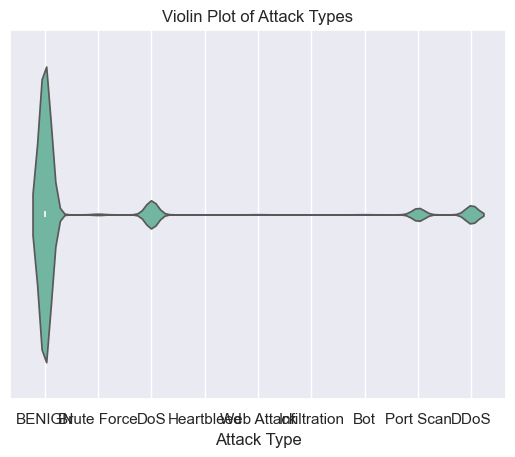

In [76]:
sns.violinplot(x=data['Attack Type'])
plt.title('Violin Plot of Attack Types')
plt.show()

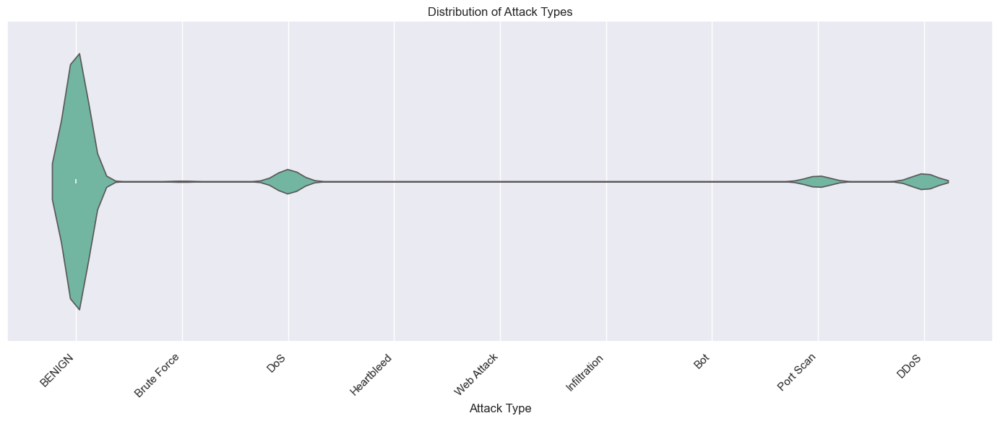

In [77]:
plt.figure(figsize=(14, 6))
sns.violinplot(x='Attack Type', data=data)
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Attack Types')
plt.tight_layout()
plt.show()

In [78]:
sampled_data.drop('Attack Number', axis = 1, inplace = True)
data.drop('Attack Number', axis = 1, inplace = True)

In [79]:
# Identifying outliers
numeric_data = sampled_data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)

                             Outlier Count  Outlier Percentage
Destination Port                    109246               21.66
Flow Duration                        93195               18.47
Total Fwd Packets                    50245                9.96
Total Backward Packets               47509                9.42
Total Length of Fwd Packets          62790               12.45
Total Length of Bwd Packets         114959               22.79
Fwd Packet Length Max                49348                9.78
Fwd Packet Length Min                 2490                0.49
Fwd Packet Length Mean               35398                7.02
Fwd Packet Length Std                47567                9.43
Bwd Packet Length Max                74464               14.76
Bwd Packet Length Min                13428                2.66
Bwd Packet Length Mean               87290               17.30
Bwd Packet Length Std                91318               18.10
Flow Bytes/s                         94952             

In [80]:
outlier_counts = {}
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        attack_data = sampled_data[i][sampled_data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in sampled_data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()

Feature: Destination Port
- BENIGN: 93525 (22.33%)
- DoS: 0 (0.00%)
- DDoS: 2 (0.01%)
- Port Scan: 2305 (12.51%)
- Brute Force: 0 (0.00%)
- Web Attack: 0 (0.00%)
- Bot: 0 (0.00%)
- Infiltration: 0 (0.00%)
- Heartbleed: 0 (0.00%)

Feature: Flow Duration
- BENIGN: 97175 (23.20%)
- DoS: 8444 (21.87%)
- DDoS: 4397 (16.96%)
- Port Scan: 403 (2.19%)
- Brute Force: 443 (23.86%)
- Web Attack: 67 (15.62%)
- Bot: 0 (0.00%)
- Infiltration: 1 (25.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Fwd Packets
- BENIGN: 77615 (18.53%)
- DoS: 464 (1.20%)
- DDoS: 833 (3.21%)
- Port Scan: 272 (1.48%)
- Brute Force: 0 (0.00%)
- Web Attack: 68 (15.85%)
- Bot: 7 (1.82%)
- Infiltration: 1 (25.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Backward Packets
- BENIGN: 59799 (14.28%)
- DoS: 4479 (11.60%)
- DDoS: 0 (0.00%)
- Port Scan: 97 (0.53%)
- Brute Force: 0 (0.00%)
- Web Attack: 36 (8.39%)
- Bot: 7 (1.82%)
- Infiltration: 1 (25.00%)
- Heartbleed: 0 (0.00%)

Feature: Total Length of Fwd Packets
- BENIGN: 80997 (19

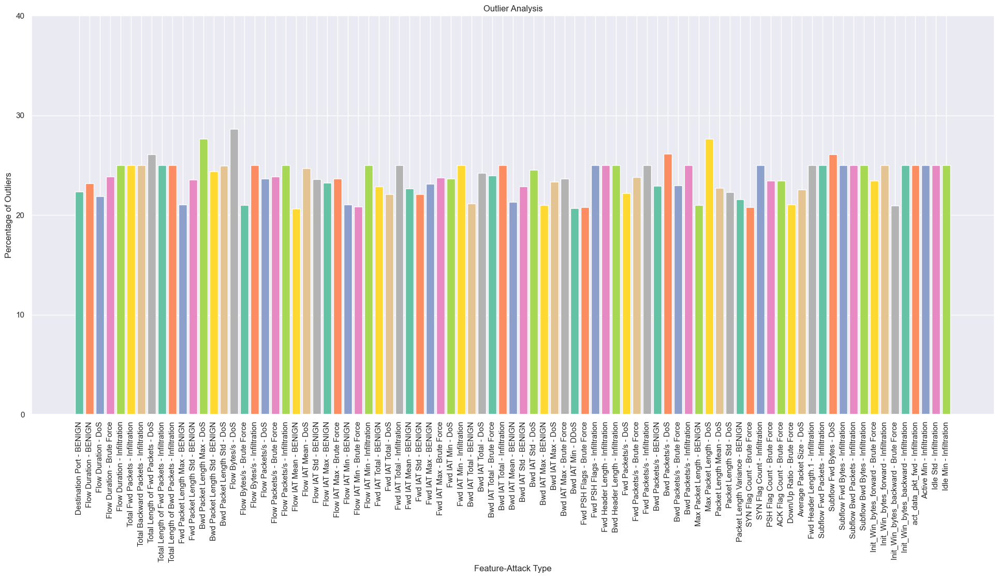

In [81]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in sampled_data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()

Visualization of column relationships (Categorical Variables)

C:\Users\USER\AppData\Local\Temp\ipykernel_11640\2387385610.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)


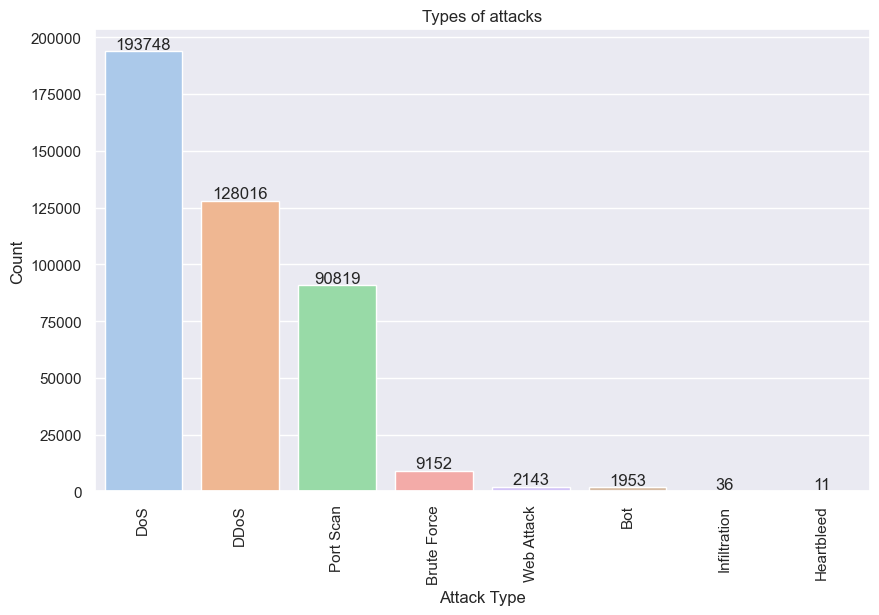

In [82]:
# Different 'Attack Type' in the main dataset excluding 'BENIGN'
attacks = data.loc[data['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()
     

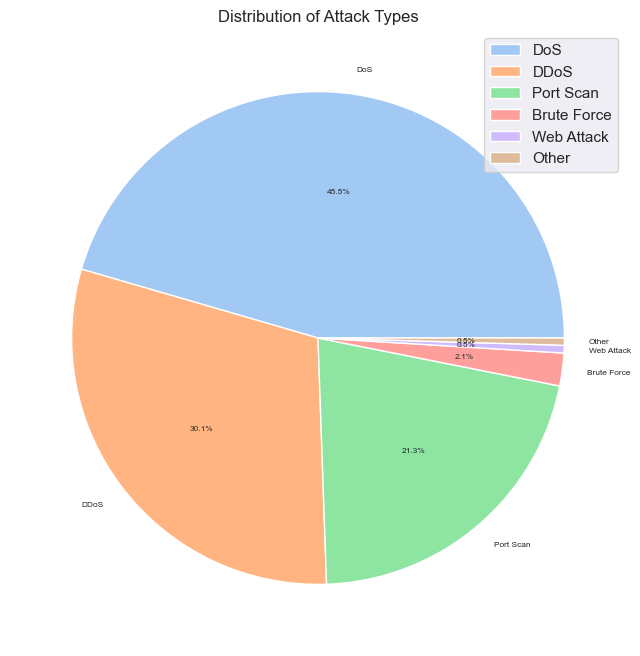

In [83]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()

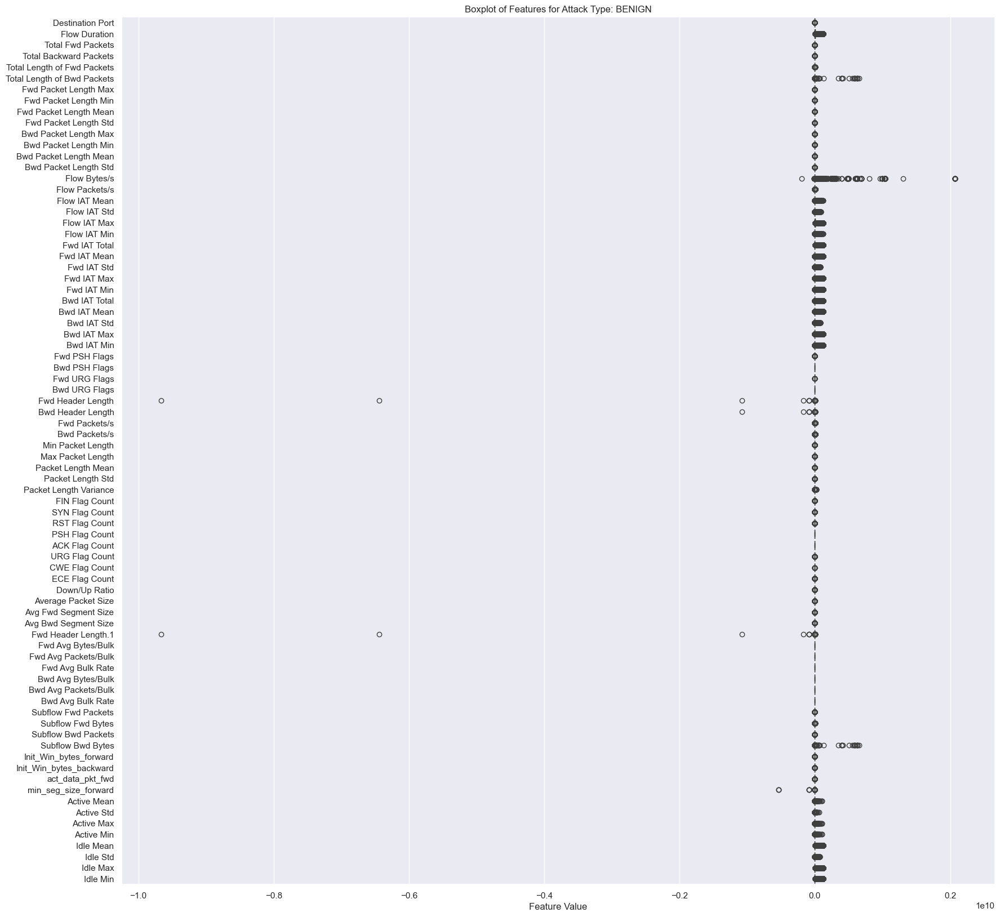

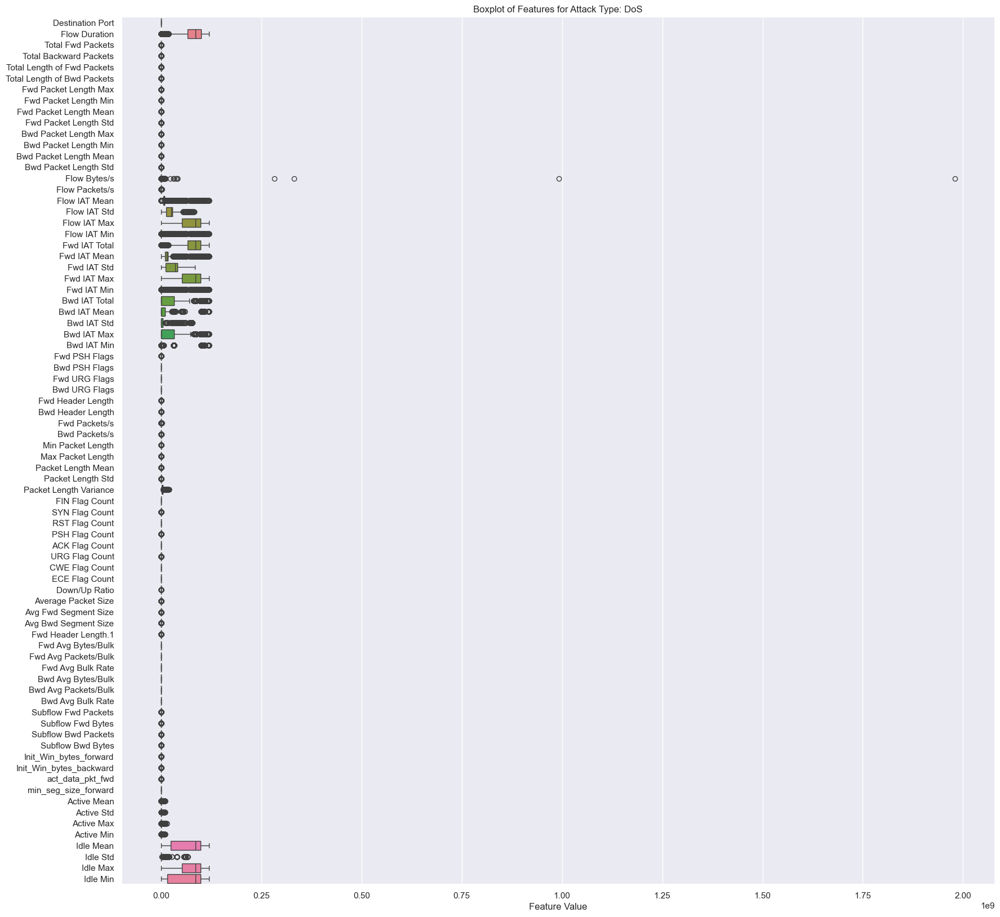

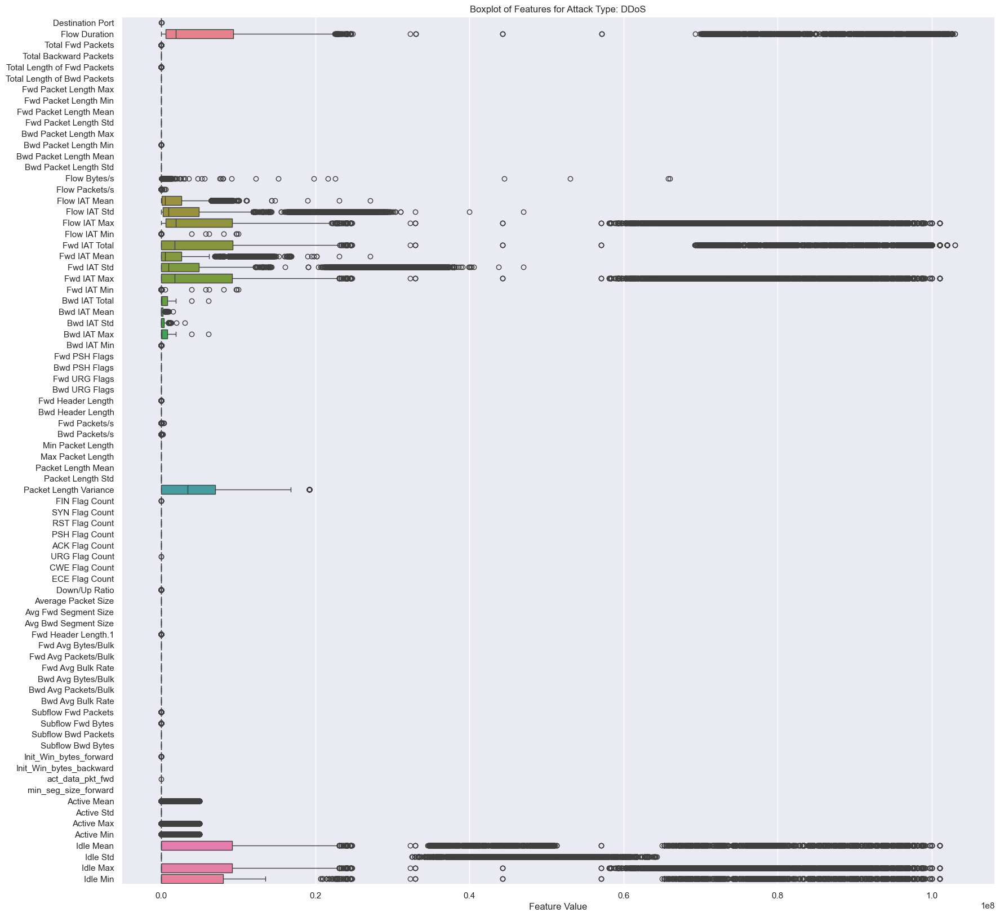

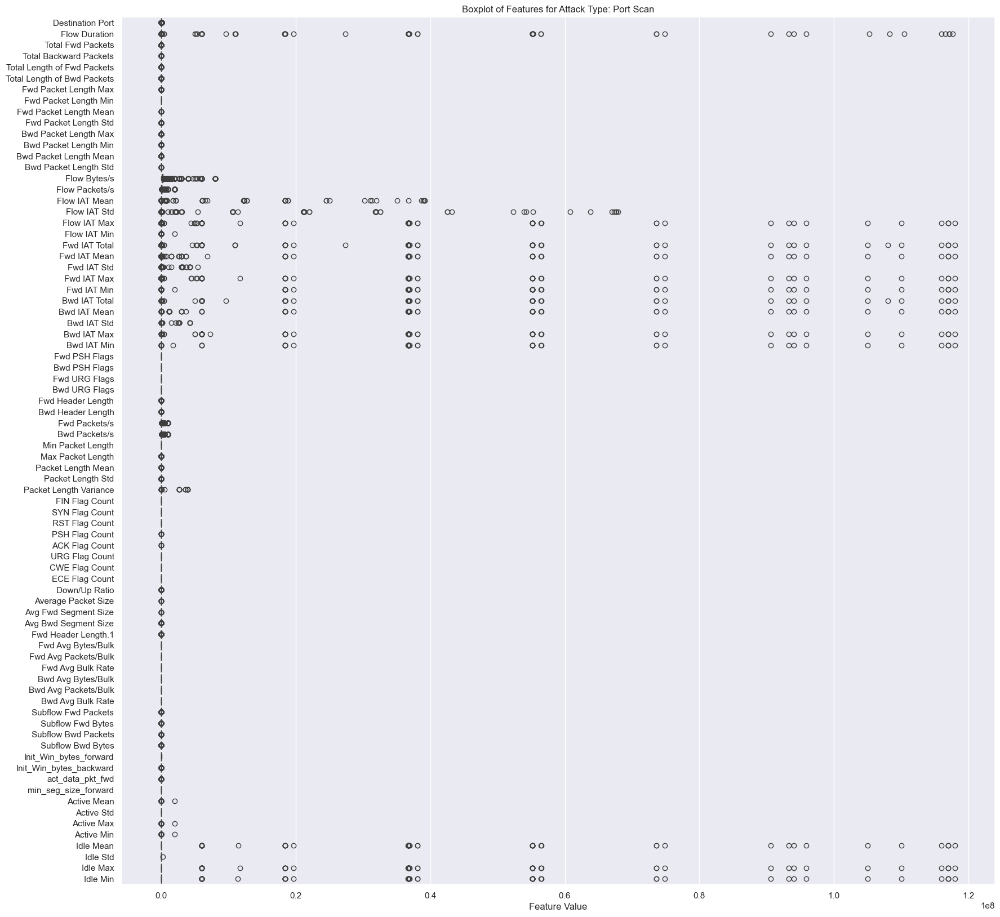

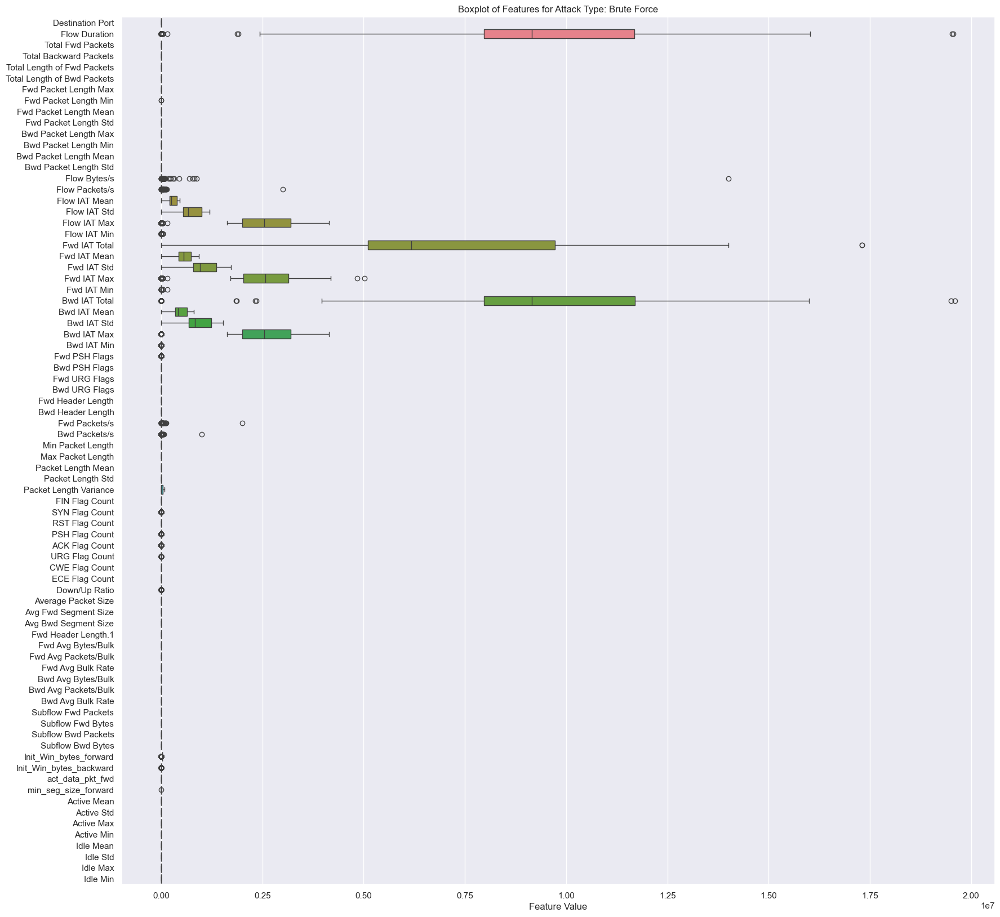

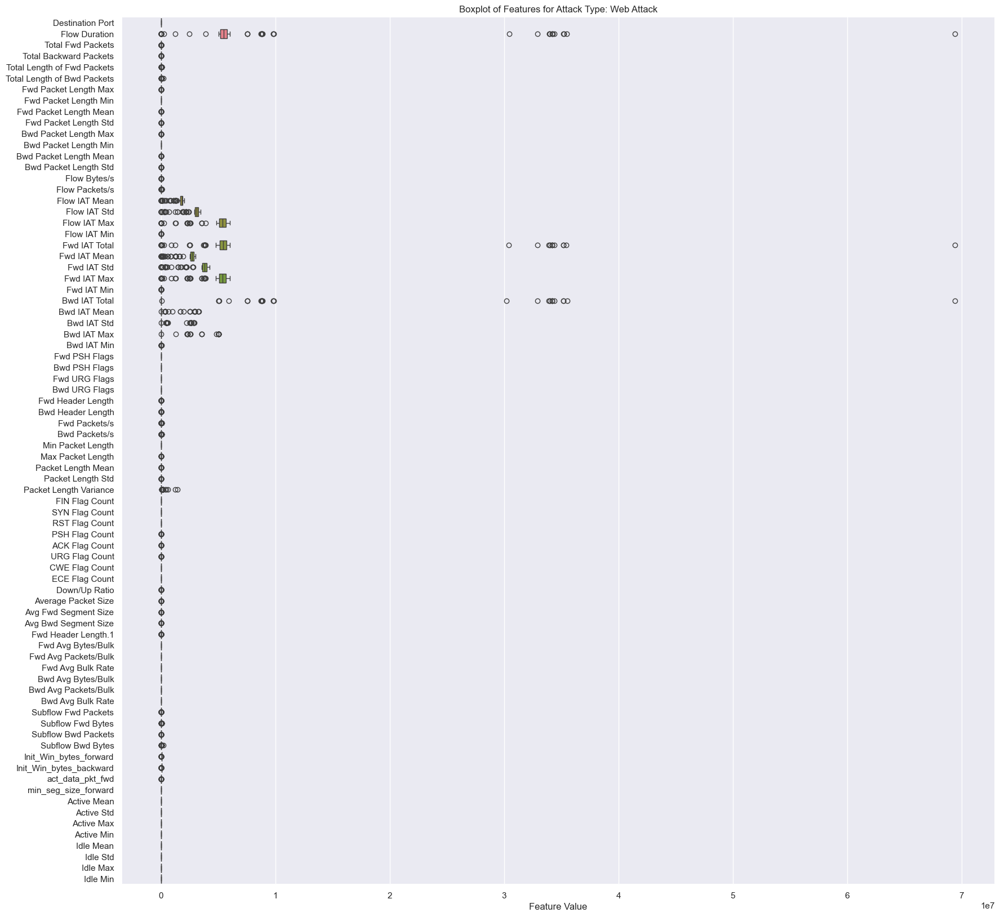

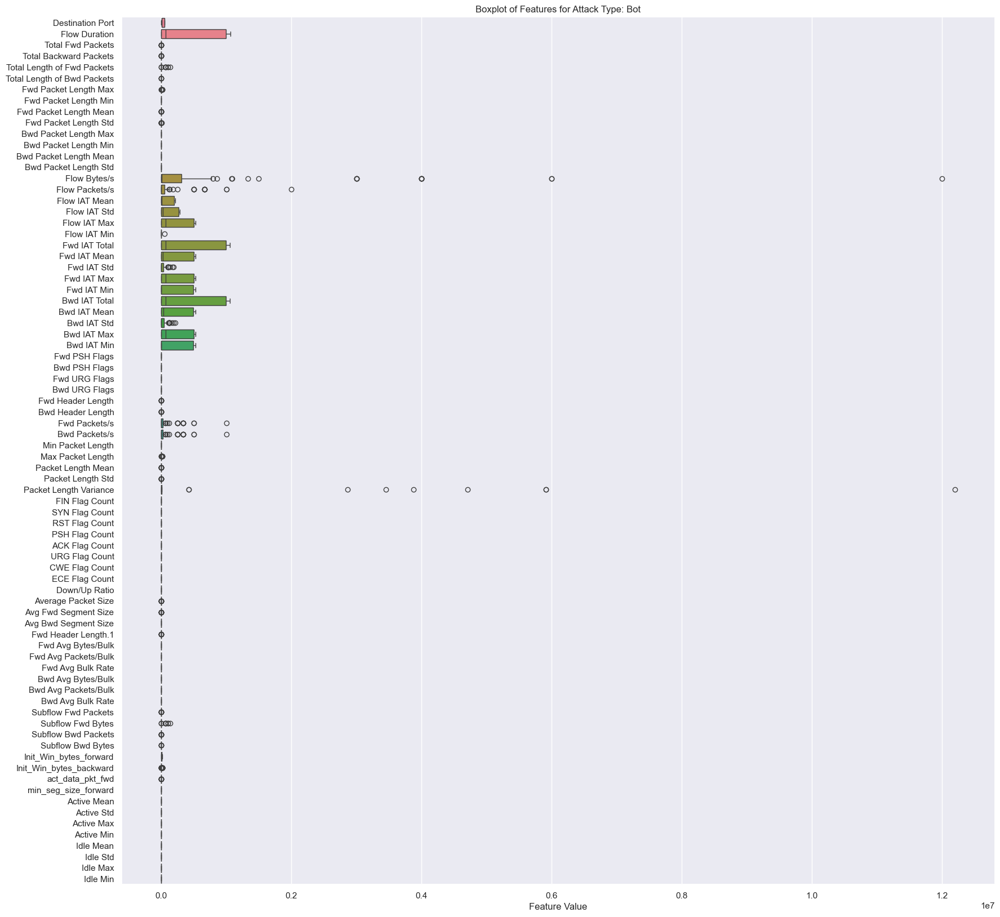

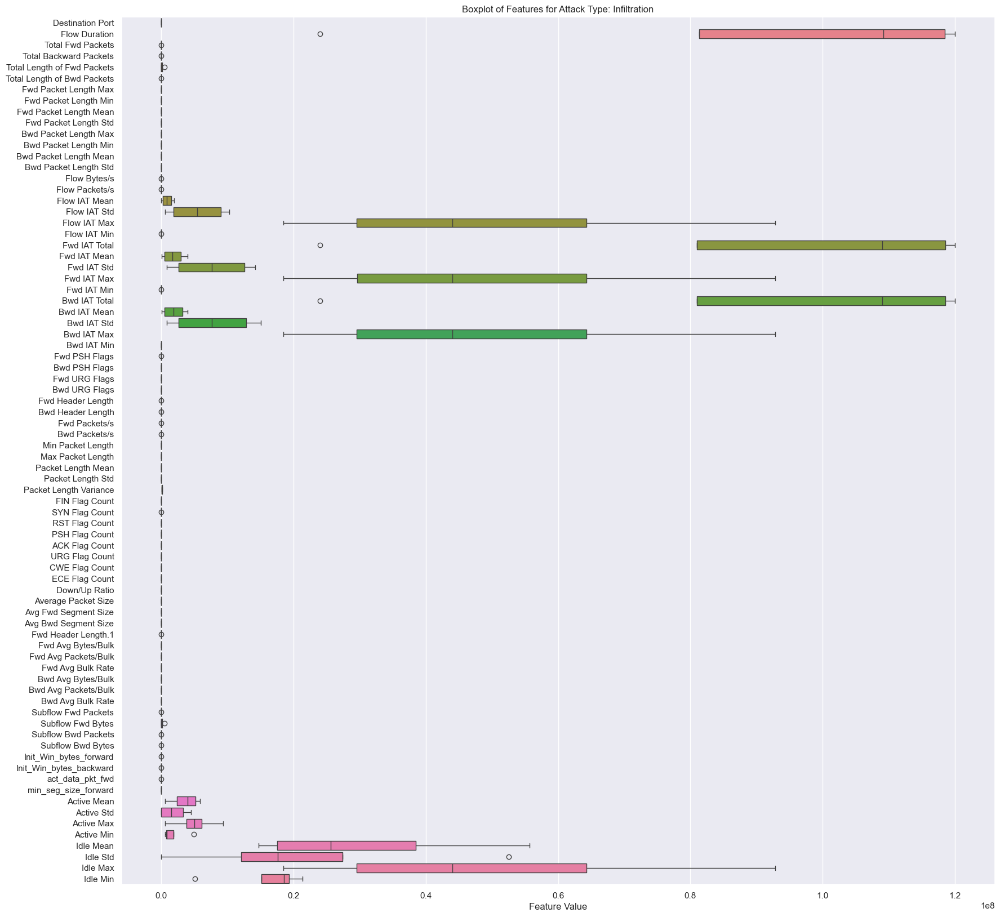

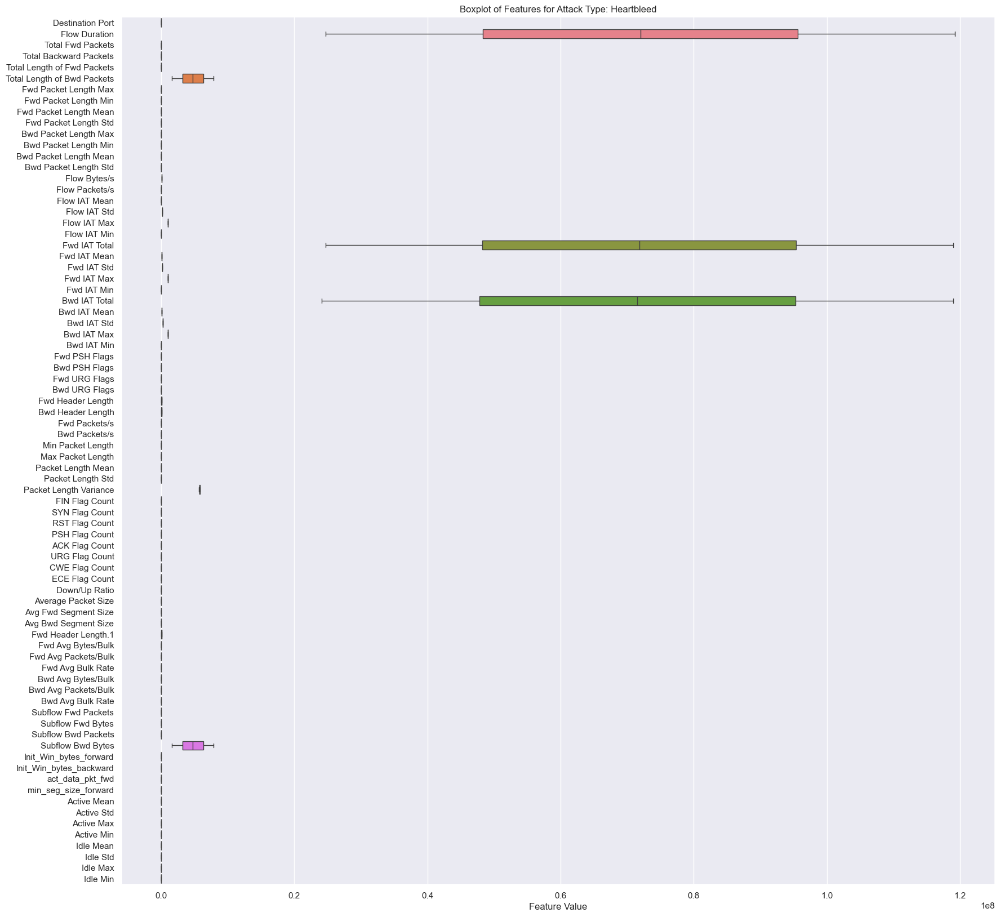

In [84]:
# Creating a boxplot for each attack type with the columns of sampled dataset
for attack_type in sampled_data['Attack Type'].unique():
    attack_data = sampled_data[sampled_data['Attack Type'] == attack_type]
    plt.figure(figsize=(20, 20))
    sns.boxplot(data = attack_data.drop(columns = ['Attack Type']), orient = 'h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()
     

In [85]:
data.groupby('Attack Type').first()

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,AttackBinary
Attack Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BENIGN,49188,4,2,0,12,0,6,6,6.000000,0.000000,0,0,0.000000,0.000000,3.000000e+06,500000.000000,4.000000e+00,0.000000e+00,4,4,4,4.000000e+00,0.000000e+00,4,4,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,40,0,500000.000000,0.000000,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,0,9.000000,6.000000,0.000000,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.00000,0,0,0.0,0.00000,0,0,Normal
Bot,8080,60202640,9,9,322,256,322,0,35.777778,107.333333,256,0,28.444444,85.333333,9.600908e+00,0.298990,3.541332e+06,4.901981e+06,10200000,47,51200000,6.396442e+06,5.268490e+06,10200000,234,60200000,7.518954e+06,4.645137e+06,10300000,637,0,0,0,0,296,296,0.149495,0.149495,0,322,30.421053,91.783753,8.424257e+03,0,0,0,1,0,0,0,0,1,32.111111,35.777778,28.444444,296,0,0,0,0,0,0,9,322,9,256,29200,110,1,32,63678.2,22252.53596,103175,50911,10200000.0,34941.27201,10200000,10100000,Attack
Brute Force,80,5216127,3,1,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000e+00,0.766852,1.738709e+06,3.010454e+06,5214882,124,5216127,2.608064e+06,3.686598e+06,5214882,1245,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,104,40,0.575139,0.191713,0,0,0.000000,0.000000,0.000000e+00,0,0,0,1,0,0,0,0,0,0.000000,0.000000,0.000000,104,0,0,0,0,0,0,3,0,1,0,29200,28960,0,32,0.0,0.00000,0,0,0.0,0.00000,0,0,Attack
DDoS,80,1293792,3,7,26,11607,20,0,8.666667,10.263203,5840,0,1658.142857,2137.297080,8.991399e+03,7.729218,1.437547e+05,4.308658e+05,1292730,2,747,3.735000e+02,5.239661e+02,744,3,1293746,2.156243e+05,5.276719e+05,1292730,2,0,0,0,0,72,152,2.318765,5.410452,0,5840,1057.545455,1853.437529,3.435231e+06,0,0,0,1,0,0,0,0,2,1163.300000,8.666667,1658.142857,72,0,0,0,0,0,0,3,26,7,11607,8192,229,2,20,0.0,0.00000,0,0,0.0,0.00000,0,0,Attack
DoS,80,5169956,8,6,1101,4222,410,0,137.625000,185.758628,3525,0,703.666667,1395.868284,1.029603e+03,2.707953,3.976889e+05,1.368409e+06,4951173,112,218783,3.125471e+04,3.068629e+04,78311,219,5169833,1.033967e+06,2.218975e+06,5002421,840,0,0,0,0,172,132,1.547402,1.160551,0,3525,354.866667,895.115146,8.012311e+05,0,0,0,1,0,0,0,0,0,380.214286,137.625000,703.666667,172,0,0,0,0,0,0,8,1101,6,4222,8192,254,7,20,0.0,0.00000,0,0,0.0,0.00000,0,0,Attack
Heartbleed,444,119302728,2685,1729,8299,7556917,517,0,3.090875,16.858421,17376,0,4370.686524,2566.935004,6.341193e+04,36.998316,2.703438e+04,1.746258e+05,5024984,0,119000000,4.444951e+04,2.224617e+05,5025702,0,119000000,6.904091e+04,2.738674e+05,5024984,1,0,0,0,0,85928,55336,22.505772,14.492544,0,17376,1713.525708,2669.389319,7.125639e+06,0,0,0,1,0,0,0,0,0,1713.913910,3.090875,4370.686524,85928,0,0,0,0,0,0,2685,8299,1729,7556917,29200,235,

### **4. Data Preprocessing**

In [86]:
# For improving performance and reduce memory-related errors
old_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f'Initial memory usage: {old_memory_usage:.2f} MB')
for col in data.columns:
    col_type = data[col].dtype
    if col_type != object:
        c_min = data[col].min()
        c_max = data[col].max()
        # Downcasting float64 to float32
        if str(col_type).find('float') >= 0 and c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
            data[col] = data[col].astype(np.float32)

        # Downcasting int64 to int32
        elif str(col_type).find('int') >= 0 and c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
            data[col] = data[col].astype(np.int32)

new_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f"Final memory usage: {new_memory_usage:.2f} MB")

Initial memory usage: 1539.53 MB
Final memory usage: 808.25 MB


In [87]:
# Calculating percentage reduction in memory usage
print(f'Reduced memory usage: {1 - (new_memory_usage / old_memory_usage):.2%}')

Reduced memory usage: 47.50%


In [88]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2522362 entries, 0 to 2522361
Data columns (total 80 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int32  
 1   Flow Duration                int32  
 2   Total Fwd Packets            int32  
 3   Total Backward Packets       int32  
 4   Total Length of Fwd Packets  int32  
 5   Total Length of Bwd Packets  int32  
 6   Fwd Packet Length Max        int32  
 7   Fwd Packet Length Min        int32  
 8   Fwd Packet Length Mean       float32
 9   Fwd Packet Length Std        float32
 10  Bwd Packet Length Max        int32  
 11  Bwd Packet Length Min        int32  
 12  Bwd Packet Length Mean       float32
 13  Bwd Packet Length Std        float32
 14  Flow Bytes/s                 float32
 15  Flow Packets/s               float32
 16  Flow IAT Mean                float32
 17  Flow IAT Std                 float32
 18  Flow IAT Max                 int32  
 19  

In [89]:
data['AttackBinary'].unique()

array(['Normal', 'Attack'], dtype=object)

In [90]:
data['Attack Type'].unique()

array(['BENIGN', 'Brute Force', 'DoS', 'Heartbleed', 'Web Attack',
       'Infiltration', 'Bot', 'Port Scan', 'DDoS'], dtype=object)

In [91]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Destination Port,2522362.0,8.704762e+03,1.902507e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2522362.0,1.658132e+07,3.522426e+07,-1.300000e+01,208.000000,50577.000000,5.329717e+06,1.200000e+08
Total Fwd Packets,2522362.0,1.027627e+01,7.941738e+02,1.000000e+00,2.000000,2.000000,6.000000e+00,2.197590e+05
Total Backward Packets,2522362.0,1.156596e+01,1.056594e+03,0.000000e+00,1.000000,2.000000,5.000000e+00,2.919220e+05
Total Length of Fwd Packets,2522362.0,6.115751e+02,1.058499e+04,0.000000e+00,12.000000,66.000000,3.320000e+02,1.290000e+07
Total Length of Bwd Packets,2522362.0,1.813315e+04,2.397434e+06,0.000000e+00,6.000000,155.000000,9.880000e+02,6.554530e+08
Fwd Packet Length Max,2522362.0,2.310918e+02,7.561625e+02,0.000000e+00,6.000000,40.000000,2.020000e+02,2.482000e+04
Fwd Packet Length Min,2522362.0,1.919464e+01,6.079447e+01,0.000000e+00,0.000000,2.000000,3.700000e+01,2.325000e+03
Fwd Packet Length Mean,2522362.0,6.347011e+01,1.955015e+02,0.000000e+00,6.000000,36.111111,5.200000e+01,5.940857e+03
Fwd Packet Length Std,2522362.0,7.727759e+01,2.967953e+02,0.000000e+00,0.000000,0.000000,7.413914e+01,7.125597e+03


In [92]:
# Dropping columns with only one unique value
num_unique = data.nunique()
one_variable = num_unique[num_unique == 1]
not_one_variable = num_unique[num_unique > 1].index

dropped_cols = one_variable.index
data = data[not_one_variable]

print('Dropped columns:')
dropped_cols

Dropped columns:


Index(['Bwd PSH Flags', 'Bwd URG Flags', 'Fwd Avg Bytes/Bulk',
       'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate', 'Bwd Avg Bytes/Bulk',
       'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate'],
      dtype='object')

In [93]:
data.shape

(2522362, 72)

In [94]:
data.columns

Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd URG Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Min Packet Length', 'Max Packet Length',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance',
       'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count',

Apply PCA to reduce dimensions

In [95]:
data.sample(20)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Fwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,AttackBinary,Attack Type
442027,80,15176034,13,14,1584,16838,384,0,121.846153,181.912918,2509,0,1202.714233,749.552246,1.213888e+03,1.779121,5.836936e+05,2.121909e+06,9800606,17,15176034,1.264670e+06,3.051969e+06,9800606,117,10120315,7.784858e+05,2.777233e+06,10021601,154,0,0,272,304,0.856614,0.922507,0,2509,657.928589,770.397339,5.935121e+05,0,0,0,1,0,0,0,0,1,682.296326,121.846153,1202.714233,272,13,1584,14,16838,8192,294,12,20,171460.500000,209942.125000,319912,23009,7416556.5,3.371555e+06,9800606,5032507,Normal,BENIGN
1965042,443,119,3,0,65,0,53,6,21.666666,27.135462,0,0,0.000000,0.000000,5.462185e+05,25210.083984,5.950000e+01,1.626346e+01,71,48,119,5.950000e+01,1.626346e+01,71,48,0,0.000000e+00,0.000000e+00,0,0,0,0,60,0,25210.083984,0.000000,6,53,17.750000,23.500000,5.522500e+02,0,0,0,0,1,0,0,0,0,23.666666,21.666666,0.000000,60,3,65,0,0,64620,-1,2,20,0.000000,0.000000,0,0,0.0,0.000000e+00,0,0,Normal,BENIGN
1550457,53,266,2,2,74,558,37,37,37.000000,0.000000,279,279,279.000000,0.000000,2.375940e+06,15037.593750,8.866666e+01,1.466470e+02,258,4,4,4.000000e+00,0.000000e+00,4,4,4,4.000000e+00,0.000000e+00,4,4,0,0,40,40,7518.796875,7518.796875,37,279,133.800003,132.548859,1.756920e+04,0,0,0,0,0,0,0,0,1,167.250000,37.000000,279.000000,40,2,74,2,558,-1,-1,1,20,0.000000,0.000000,0,0,0.0,0.000000e+00,0,0,Normal,BENIGN
931425,443,117796483,17,18,5167,479,3333,0,303.941162,837.414307,213,0,26.611111,63.245682,4.793012e+01,0.297123,3.464602e+06,4.687507e+06,10200000,36,118000000,7.360010e+06,4.264718e+06,10200000,37104,118000000,6.927072e+06,4.513643e+06,10200000,240,0,0,544,576,0.144317,0.152806,0,3333,156.833328,585.196716,3.424552e+05,0,0,0,0,1,0,0,0,1,161.314285,303.941162,26.611111,544,17,5167,18,479,65236,65535,3,32,179228.078125,494696.843750,1750097,35428,9634119.0,1.228146e+06,10200000,6718601,Normal,BENIGN
2258971,1122,63,1,1,0,6,0,0,0.000000,0.000000,6,6,6.000000,0.000000,9.523809e+04,31746.031250,6.300000e+01,0.000000e+00,63,63,0,0.000000e+00,0.000000e+00,0,0,0,0.000000e+00,0.000000e+00,0,0,0,0,40,20,15873.015625,15873.015625,0,6,2.000000,3.464102,1.200000e+01,0,0,0,1,0,0,0,0,1,3.000000,0.000000,6.000000,40,1,0,1,6,29200,0,0,40,0.000000,0.000000,0,0,0.0,0.000000e+00,0,0,Attack,Port Scan
1333259,53,181708,2,2,64,242,32,32,32.000000,0.000000,121,121,121.000000,0.000000,1.684021e+03,22.013340,6.056933e+04,1.048650e+05,181657,4,4,4.000000e+00,0.000000e+00,4,4,47,4.700000e+01,0.000000e+00,47,47,0,0,64,64,11.006670,11.006670,32,121,67.599998,48.747307,2.376300e+03,0,0,0,0,0,0,0,0,1,84.500000,32.000000,121.000000,64,2,64,2,242,-1,-1,1,32,0.000000,0.000000,0,0,0.0,0.000000e+00,0,0,Normal,BENIGN
667482,443,115361902,23,26,2754,18255,1205,0,119.739128,342.436218,2920,0,702.115356,847.739136,1.821138e+02,0.424750,2.403373e+06,4.243508e+06,10000000,3,115000000,5.243723e+06,4.993003e+06,10000000,3,1

In [96]:
# features = data.drop('Attack Type', axis = 1)
# attacks = data['Attack Type']

In [97]:
# features.select_dtypes(include='object').columns

In [98]:
# data['AttackBinary'].unique()

In [99]:
data['AttackBinary'] = data['AttackBinary'].map({'Normal': 0, 'Attack': 1})

In [100]:
assert data["AttackBinary"].isnull().sum() == 0, "Label encoding failed"

In [101]:
data.sample(10)

,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Fwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,AttackBinary,Attack Type
895802,53,241,2,2,72,328,36,36,36.000000,0.000000,164,164,164.00,0.0,1.659751e+06,16597.509766,80.333336,4.751140e+01,135,49,57,5.700000e+01,0.000,57,57,49,49.000000,0.000000,49,49,0,0,40,40,8298.754883,8298.754883,36,164,87.199997,70.108490,4915.200195,0,0,0,0,0,0,0,0,1,109.000000,36.000000,164.00,40,2,72,2,328,-1,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,0,BENIGN
379131,53,223,2,2,62,158,31,31,31.000000,0.000000,79,79,79.00,0.0,9.865471e+05,17937.220703,74.333336,8.945576e+01,174,1,1,1.000000e+00,0.000,1,1,48,48.000000,0.000000,48,48,0,0,80,80,8968.610352,8968.610352,31,79,50.200001,26.290682,691.200012,0,0,0,0,0,0,0,0,1,62.750000,31.000000,79.00,80,2,62,2,158,-1,-1,1,40,0.0,0.0,0,0,0.0,0.0,0,0,0,BENIGN
2044740,443,4078957,5,1,135,46,46,6,27.000000,20.124611,46,46,46.00,0.0,4.437409e+01,1.470964,815791.375000,1.758508e+06,3961332,47,4078957,1.019739e+06,1961393.125,3961332,47,0,0.000000,0.000000,0,0,1,0,100,20,1.225804,0.245161,6,46,32.428570,18.866701,355.952393,0,1,0,0,1,0,0,0,0,37.833332,27.000000,46.00,100,5,135,1,46,258,360,4,20,0.0,0.0,0,0,0.0,0.0,0,0,0,BENIGN
1778026,49391,75,1,1,6,6,6,6,6.000000,0.000000,6,6,6.00,0.0,1.600000e+05,26666.666016,75.000000,0.000000e+00,75,75,0,0.000000e+00,0.000,0,0,0,0.000000,0.000000,0,0,0,0,20,20,13333.333008,13333.333008,6,6,6.000000,0.000000,0.000000,0,0,0,0,1,1,0,0,1,9.000000,6.000000,6.00,20,1,6,1,6,292,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,0,BENIGN
2065145,53,163,2,2,84,228,42,42,42.000000,0.000000,114,114,114.00,0.0,1.914110e+06,24539.876953,54.333332,5.676560e+01,114,1,48,4.800000e+01,0.000,48,48,1,1.000000,0.000000,1,1,0,0,64,64,12269.938477,12269.938477,42,114,70.800003,39.436024,1555.199951,0,0,0,0,0,0,0,0,1,88.500000,42.000000,114.00,64,2,84,2,228,-1,-1,1,32,0.0,0.0,0,0,0.0,0.0,0,0,0,BENIGN
1271542,443,147,2,0,0,0,0,0,0.000000,0.000000,0,0,0.00,0.0,0.000000e+00,13605.442383,147.000000,0.000000e+00,147,147,147,1.470000e+02,0.000,147,147,0,0.000000,0.000000,0,0,0,0,64,0,13605.442383,0.000000,0,0,0.000000,0.000000,0.000000,0,0,0,0,1,0,0,0,0,0.000000,0.000000,0.00,64,2,0,0,0,355,-1,0,32,0.0,0.0,0,0,0.0,0.0,0,0,0,BENIGN
486824,53,59201,2,2,90,146,45,45,45.000000,0.000000,73,73,73.00,0.0,3.986419e+03,67.566429,19733.666016,3.409484e+04,59103,49,49,4.900000e+01,0.000,49,49,49,49.000000,0.000000,49,49,0,0,64,40,33.783215,33.783215,45,73,56.200001,15.336231,235.199997,0,0,0,0,0,0,0,0,1,70.250000,45.000000,73.00,64,2,90,2,146,-1,-1,1,32,0.0,0.0,0,0,0.0,0.0,0,0,0,BENIGN
250418,53,150,2,2,88,188,44,44,44.000000,0.000000,94,94,94.00,0.0,1.840000e+06,26666.666016,50.000000,8.054192e+01,143,3,3,3.000000e+00,0.000,3,3,4,4.000000,0.000000,4,4,0,0,64,64,13333.333008,13333.333008,44,94,64.000000,27.386127,750.000000,0,0,0,0,0,0,0,0,1,80.000000,44.000000,94.00,64,2,88,2,188,-1,-1,1,32,0.0,0.0,0,0,0.0,0.0,0,0,0,BENIGN
1847750,443,5035018,7,4,599,

### **5. Model Training**

In [102]:
y = data["AttackBinary"]

In [103]:
drop_cols = ["AttackBinary", "Attack Type" ]

In [104]:
X = data.drop(columns=[c for c in drop_cols if c in data.columns])

In [105]:
print("Total features:", X.shape[1])

Total features: 70


**Train - Test Split**

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE)

**Feature Scaling**

In [107]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [108]:
CONTAMINATION = len(y_train[y_train == 1]) / len(y_train)

In [109]:
print(f"Estimated contamination: {CONTAMINATION:.4f}")

Estimated contamination: 0.1688


In [110]:
iso_forest = IsolationForest(
    n_estimators=200,
    contamination=CONTAMINATION,
    random_state=RANDOM_STATE,
    n_jobs=-1
)

In [111]:
iso_forest.fit(X_train_scaled)

,n_estimators,200
,max_samples,'auto'
,contamination,0.16884080343368738
,max_features,1.0
,bootstrap,False
,n_jobs,-1
,random_state,42
,verbose,0
,warm_start,False


**Threshold**

In [112]:
train_scores = -iso_forest.decision_function(X_train_scaled)
test_scores = -iso_forest.decision_function(X_test_scaled)

In [113]:
attack_ratio = float(y_train.mean() * 100)
THRESHOLD_PERCENTILE = round(100 - attack_ratio, 2)

print("Attack ratio:", attack_ratio)
print("Threshold percentile:", THRESHOLD_PERCENTILE)

Attack ratio: 16.884080343368737
Threshold percentile: 83.12


In [114]:
threshold = np.percentile(train_scores, THRESHOLD_PERCENTILE)

print("Attack ratio:", attack_ratio)
print("Threshold percentile:", THRESHOLD_PERCENTILE)
print("Percentile Threshold:", threshold)

Attack ratio: 16.884080343368737
Threshold percentile: 83.12
Percentile Threshold: 4.329860927225919e-05


In [115]:
# threshold = np.percentile(train_scores, THRESHOLD_PERCENTILE)
# print(f"Calculated Threshold (Score > {threshold:.4f} is Anomaly)")

In [116]:
# threshold = np.percentile(train_scores, THRESHOLD_PERCENTILE)
# print(f"\n[INFO] Calculated Threshold at {THRESHOLD_PERCENTILE}th percentile: {threshold:.4f}")

In [117]:
# # Check precision
# print(f"Precise Threshold: {threshold:.20f}")

# # Check for duplicates in scores (Clumping)
# unique_scores = np.unique(train_scores)
# print(f"Total rows: {len(train_scores)}")
# print(f"Unique scores found: {len(unique_scores)}")

# # Check how many items are exactly at 0
# zeros = np.sum(train_scores == 0)
# print(f"Rows with score exactly 0: {zeros}")

In [118]:
# # --- Step 5: Find OPTIMAL Threshold ---
# print("Optimizing Threshold for Max F1 Score...")
    
# # Get precision, recall, and thresholds from the curve
# precision, recall, thresholds = precision_recall_curve(y_test, test_scores)
    
# # Calculate F1 for every single threshold
# numerator = 2 * recall * precision
# denominator = recall + precision
# f1_scores = np.divide(numerator, denominator, out=np.zeros_like(numerator), where=denominator!=0)
    
# # Find the index of the best F1 score
# best_idx = np.argmax(f1_scores)
# best_threshold = thresholds[best_idx]
# best_f1 = f1_scores[best_idx]
    
# print(f"\n🚀 OPTIMIZATION RESULTS 🚀")
# print(f"Best Threshold Found: {best_threshold:.6f}")
# print(f"Max Potential F1 Score: {best_f1:.4f}")

In [119]:
# Prediction logic: If score > threshold, it's an Attack (1)
y_pred = (test_scores >= threshold).astype(int)

### **6. Evaluation**

In [120]:
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, test_scores)
avg_precision = average_precision_score(y_test, test_scores)

In [121]:
precision, recall, _ = precision_recall_curve(y_test, test_scores)

In [122]:
print("\n==============================")
print("Isolation Forest Evaluation")
print("==============================")
print(f"F1 Score        : {f1:.4f}")
print(f"ROC-AUC         : {roc_auc:.4f}")
print(f"Avg Precision   : {avg_precision:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["BENIGN", "ATTACK"]))


Isolation Forest Evaluation
F1 Score        : 0.4803
ROC-AUC         : 0.7564
Avg Precision   : 0.3506

Classification Report:
              precision    recall  f1-score   support

      BENIGN       0.89      0.89      0.89    419297
      ATTACK       0.48      0.48      0.48     85176

    accuracy                           0.82    504473
   macro avg       0.69      0.69      0.69    504473
weighted avg       0.82      0.82      0.82    504473



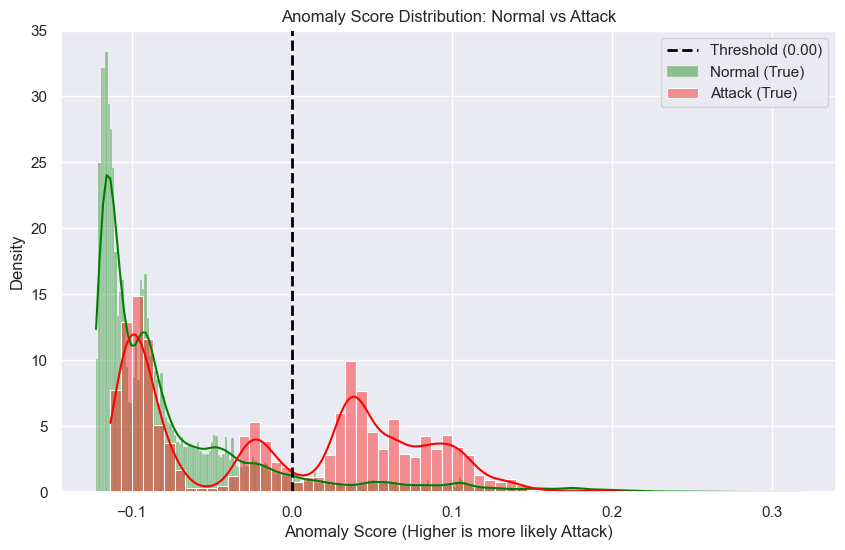

In [123]:
plt.figure(figsize=(10, 6))
sns.histplot(test_scores[y_test==0], color='green', label='Normal (True)', kde=True, stat="density", alpha=0.4)
sns.histplot(test_scores[y_test==1], color='red', label='Attack (True)', kde=True, stat="density", alpha=0.4)
plt.axvline(threshold, color='black', linestyle='--', linewidth=2, label=f'Threshold ({threshold:.2f})')
plt.title('Anomaly Score Distribution: Normal vs Attack')
plt.xlabel('Anomaly Score (Higher is more likely Attack)')
plt.legend()
plt.show()

In [ ]:
# joblib.dump(
#     {
#         "model": iso_forest,
#         "scaler": scaler,
#         "threshold": threshold,
#         "threshold_percentile": THRESHOLD_PERCENTILE,
#         "features": X.columns.tolist(),
#         "metrics": {
#             "f1": f1,
#             "roc_auc": roc_auc,
#             "pr_auc": pr_auc
#         }
#     },
#     MODEL_PATH
# )

In [124]:
MODEL_PATH = "isolation_forest_baseline.pkl"

joblib.dump(
    {
        "model": iso_forest,
        "scaler": scaler,
        "threshold": threshold,
        "threshold_percentile": THRESHOLD_PERCENTILE,
        "contamination": CONTAMINATION,
        "features": X.columns.tolist()
    },
    MODEL_PATH
)

print(f"✅ Model saved successfully at: {MODEL_PATH}")



✅ Model saved successfully at: isolation_forest_baseline.pkl


In [ ]:
# param_grid = {
#     "n_estimators": [200, 300, 400],
#     "max_samples": ["auto", 0.6, 0.8],
#     "contamination": [0.12, 0.15, 0.18],
#     "threshold_percentile": [75, 80, 83, 85, 88]
# }

# results = []

# # =====================================================
# # GRID SEARCH (MANUAL)
# # =====================================================
# for n_estimators in param_grid["n_estimators"]:
#     for max_samples in param_grid["max_samples"]:
#         for contamination in param_grid["contamination"]:

#             model = IsolationForest(
#                 n_estimators=n_estimators,
#                 max_samples=max_samples,
#                 contamination=contamination,
#                 random_state=42,
#                 n_jobs=-1
#             )

#             model.fit(X_train)

#             train_scores = -model.decision_function(X_train)
#             test_scores = -model.decision_function(X_test)

#             for p in param_grid["threshold_percentile"]:
#                 threshold = np.percentile(train_scores, p)
#                 y_pred = (test_scores >= threshold).astype(int)

#                 f1 = f1_score(y_test, y_pred)
#                 roc_auc = roc_auc_score(y_test, test_scores)
#                 pr_auc = average_precision_score(y_test, test_scores)

#                 results.append({
#                     "n_estimators": n_estimators,
#                     "max_samples": max_samples,
#                     "contamination": contamination,
#                     "threshold_percentile": p,
#                     "f1": f1,
#                     "roc_auc": roc_auc,
#                     "pr_auc": pr_auc
#                 })

# # =====================================================
# # RESULTS
# # =====================================================
# results_df = pd.DataFrame(results)
# results_df = results_df.sort_values(by="f1", ascending=False)

# print("\nTop 10 Configurations:")
# print(results_df.head(10))

# # =====================================================
# # BEST CONFIG
# # =====================================================
# best = results_df.iloc[0]
# print("\nBEST CONFIGURATION:")
# print(best)


Top 10 Configurations:
    n_estimators max_samples  contamination  threshold_percentile        f1  \
72           300         0.6           0.18                    83  0.514430   
67           300         0.6           0.15                    83  0.514430   
62           300         0.6           0.12                    83  0.514430   
77           300         0.8           0.12                    83  0.514167   
87           300         0.8           0.18                    83  0.514167   
82           300         0.8           0.15                    83  0.514167   
78           300         0.8           0.12                    85  0.513726   
88           300         0.8           0.18                    85  0.513726   
83           300         0.8           0.15                    85  0.513726   
33           200         0.8           0.12                    85  0.512405   

     roc_auc    pr_auc  
72  0.779054  0.379636  
67  0.779054  0.379636  
62  0.779054  0.379636  
77  0.